This notebook contains the code that was used to generate the figures and derive insights from the results that are published in the paper "*SOMS: Stochastic Opportunistic Maintenance Scheduling For Offshore Wind Farms*," to be submitted at the IISE Transactions on Operations Engineering and Analytics.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
import seaborn as sns
from time import time
import gcsfs, pickle
import os
#import sys
#sys.path.insert(1, '../')

In [2]:
from SOMS import *

In [3]:
fnt = {'fontname':'Times New Roman'} 
plt.rc('font',family='Times New Roman',size=14)#是一个函数，用于设置全局的字体和大小。它的参数是：
#'font' 表示要设置的属性是字体。family='Times New Roman' 表示要使用的字体是 'Times New Roman'。size=14 表示要使用的字体大小是 14 点。

In [4]:
def get_true_costs(all_sols):#函数的名称是 get_true_costs，参数是 all_sols，表示所有的解决方案字典。
    """
    返回一个列表，其中包含完整解决方案字典中每个样本的成本。
    """
    costs = [] #是一个空列表，用于存储每个样本的成本。
    for sample in all_sols.keys():  #是一个循环语句，遍历所有解决方案字典中的键，即样本编号。
        costs.append(np.sum([all_sols[sample]['simulation'][i]['expected_STH_cost'] 
                   for i in range(len(all_sols[sample]['time_per_roll'])) ]) )
#是一个列表推导式，用于计算每个样本的成本。   它使用了 np.sum 函数，对列表中的元素求和。
#all_sols[sample]['simulation'][i]['expected_STH_cost']，表示每个样本中每个迭代的预期停机时间成本。
#这里使用了 range(len(all_sols[sample]['time_per_roll'])) 来获取每个样本中迭代的数量。
    return costs
#这段代码的作用是根据给定的解决方案字典，计算每个样本在模拟中产生的总成本。

# 导入天气数据并添加空间变异性

In [5]:
weather_ocean_data_df = pd.read_csv("weather_ocean_data_new.csv", index_col=[0], parse_dates=True)
data = np.array(weather_ocean_data_df)
N_t=5
wind_speed_single_true = data[:,0]
wind_speed_single_NWP = data[:,2]

wave_height_true = data[:,1]
wave_height_NWP = data[:,4]

np.random.seed(24)
sv_scale = 0.5 #[m/s]
wind_speed_true = np.random.normal(loc = wind_speed_single_true.reshape(-1,1), scale = sv_scale, 
                          size = (wind_speed_single_true.shape[0],N_t))
#reshape方法是用来改变数组的形状的。-1表示让numpy自动推断该维度的大小，1表示每个元素都是一个单独的列。
wind_speed_NWP = np.random.normal(loc = wind_speed_single_NWP.reshape(-1,1), scale = sv_scale, 
                          size = (wind_speed_single_NWP.shape[0],N_t))

In [6]:
print('Dataset start date: ', weather_ocean_data_df.index[0])
print('Dataset end date: ', weather_ocean_data_df.index[-1])

Dataset start date:  2019-08-12 00:00:00+00:00
Dataset end date:  2020-04-29 23:00:00+00:00


In [ ]:
# wind_speed_forecast=wind_speed_NWP.copy()
# wave_height_forecast=wave_height_NWP.copy()
N_S=25

el_price_ture_df = pd.read_csv("True_n_LEAR_el_prices_da_comed.csv", index_col=[0], parse_dates=True)
el_prices_true = np.array(el_price_ture_df)[:,0]
el_prices_forecast = np.array(el_price_ture_df)[:,1]

rle_true=np.array([2.0,6.8,11.5,16.2,21.0])
rle_forecast_mean=np.array([4.0,6.1,13.2,6.8,23.8])
rle_forecast_std=np.array([3,3,3,3,3])

tau=np.array([11,5,6,4,4])
rho=np.array([0,0,0,0,0])
theta=np.array([1,1,1,1,1])

max_wind=15
max_wave=1.8

file_path = "GS_5WT_25S_11.json"

# 判断文件是否存在
if not os.path.exists(file_path):
    # 如果文件不存在，创建一个空文件
    with open(file_path, "wb") as file:
        # 写入一个空的字典对象作为初始内容
        pickle.dump({}, file)
    print(f"文件 {file_path} 已创建。")

# 打开文件并读取内容
with open(file_path, "rb") as stochastic_file:
    try:
        stochastic_din = pickle.load(stochastic_file)
    except EOFError:
        stochastic_din = {}
for Din in range(99,130):
    stochastic_solution = RH_iter_solver( wind_speed_true,
                        wave_height_true,
                        wind_speed_NWP,
                        wave_height_NWP,
                        N_S,
                        Din,
                        max_wind, 
                        max_wave,
                        el_prices_true,
                        el_prices_forecast,
                        rle_true,
                        rle_forecast_mean,
                        rle_forecast_std,
                        tau,
                        rho,
                        theta,
                        rle_dist='weibull',
                        tR=5, 
                        tD=21,
                        dJ=19,
                        hist_len=5,
                        random_seed=1,
                        max_iter=None,
                        mip_gap=0.001,
                        CMS=False,   # CMS
                        AIMS=False,  
                        BESN=False,  # PK PF
                        TBS=False,   # TBS
                        NAIVE=False, # MD
                        DGP=False,   # CPF
                        GPY=False,
                        MAT=False,
                        GS=True,
                        LSTM=False,
                        MLP=False)   
    stochastic_din[f'sample {Din}'] = stochastic_solution
    with open(file_path, "wb") as stochastic_file:
        pickle.dump(stochastic_din,stochastic_file)

In [13]:
stochastic_din.keys()

dict_keys(['sample 30', 'sample 31', 'sample 32', 'sample 33', 'sample 34', 'sample 35', 'sample 36', 'sample 37', 'sample 38', 'sample 39', 'sample 40', 'sample 41', 'sample 42', 'sample 43', 'sample 44', 'sample 45', 'sample 46', 'sample 47', 'sample 48', 'sample 49', 'sample 50', 'sample 51', 'sample 52', 'sample 53', 'sample 54', 'sample 55', 'sample 56', 'sample 57', 'sample 58', 'sample 59', 'sample 60', 'sample 61', 'sample 62', 'sample 63', 'sample 64', 'sample 65', 'sample 66', 'sample 67', 'sample 68', 'sample 69', 'sample 70', 'sample 71', 'sample 72', 'sample 73', 'sample 74', 'sample 75', 'sample 76', 'sample 77', 'sample 78', 'sample 79', 'sample 80', 'sample 81', 'sample 82', 'sample 83', 'sample 84', 'sample 85', 'sample 86', 'sample 87', 'sample 88', 'sample 89', 'sample 90', 'sample 91', 'sample 92', 'sample 93', 'sample 94', 'sample 95', 'sample 96', 'sample 97', 'sample 98', 'sample 99', 'sample 100', 'sample 101', 'sample 102', 'sample 103', 'sample 104', 'sample 1

# 导入优化解决方案
请从共享的[Google Drive文件夹](https://drive.google.com/drive/folders/1kn-hTBSbv5N4VF6W8eGThGqy4OirypO5?usp=sharing)下载所有文件，并将它们保存在与此笔记本相同的工作目录中，然后运行以下单元格。

In [7]:
deterministic_true_sols = pickle.load(open("RD_HOST_5WT_09.json", "rb"))
deterministic_NWP_sols = pickle.load(open("PF_HOST_5WT_09.json", "rb"))
GS = pickle.load(open("GS_5WT_50S_12.json", "rb"))
cms = pickle.load(open("CMS_5WT_11.json", "rb"))
tbs = pickle.load(open("TBS_5WT_11.json", "rb"))
dgp = pickle.load(open("DGP-HOST_5WT.json", "rb"))
naive = pickle.load(open("NAIVE-STOCHOS_5WT_50S_1.json", "rb"))

关于优化解决方案数据

In [41]:
#解决方案以嵌套字典的形式存储——第一层键是样本编号。
GS['sample 44']['simulation']

[{'STH_sched':      wt1  wt2  wt3  wt4  wt5
  t0   0.0  0.0  0.0  0.0  0.0
  t1   0.0  0.0  0.0  0.0  0.0
  t2   0.0  0.0  0.0  0.0  0.0
  t3   0.0  0.0  0.0  0.0  0.0
  t4   0.0  0.0  0.0  0.0  0.0
  t5   0.0  0.0  0.0  0.0  0.0
  t6   0.0  0.0  0.0  0.0  0.0
  t7   0.0  0.0  0.0  0.0  0.0
  t8   0.0  0.0  0.0  0.0  0.0
  t9   0.0  0.0  0.0  0.0  0.0
  t10  0.0  0.0  0.0  0.0  0.0
  t11  0.0  0.0  0.0  0.0  0.0
  t12  0.0  0.0  0.0  0.0  0.0
  t13  0.0  0.0  0.0  0.0  0.0
  t14  0.0  0.0  0.0  0.0  0.0
  t15  0.0  0.0  0.0  0.0  0.0
  t16  0.0  0.0  0.0  0.0  0.0
  t17  0.0  0.0  0.0  0.0  0.0
  t18  0.0  0.0  0.0  0.0  0.0
  t19  0.0  0.0  0.0  0.0  0.0
  t20  0.0  0.0  0.0  0.0  0.0
  t21  0.0  0.0  0.0  0.0  0.0
  t22  0.0  0.0  0.0  0.0  0.0
  t23  0.0  0.0  0.0  0.0  0.0,
  'LTH_sched': array([[[ 1.],
          [-0.],
          [-0.],
          [-0.],
          [-0.]],
  
         [[-0.],
          [ 1.],
          [ 1.],
          [ 1.],
          [ 1.]],
  
         [[-0.],
   

In [64]:
#每个样本都是一个包含有用信息的字典。
num = 100
for i in range(len(deterministic_NWP_sols[f'sample {num}']['simulation'])):
    print(deterministic_NWP_sols[f'sample {num}']['simulation'][i]['remaining_maint_hrs'])
print("##########################")
for i in range(len(GS[f'sample {num}']['simulation'])):
    print(GS[f'sample {num}']['simulation'][i]['remaining_maint_hrs'])

[[-0.]
 [-0.]
 [-0.]
 [-0.]
 [-0.]]
[[1.]
 [0.]
 [0.]
 [0.]
 [0.]]
[[-0.]
 [-0.]
 [-0.]
 [-0.]
 [-0.]]
[[-0.]
 [-0.]
 [-0.]
 [-0.]
 [-0.]]
##########################
[[-0.]
 [-0.]
 [-0.]
 [-0.]
 [-0.]]
[[-0.]
 [-0.]
 [-0.]
 [-0.]
 [-0.]]


In [ ]:
#键'model'是一个字典，其中键是来自优化模型的变量名，值是优化后的相应值
STOCHOS['sample 30']['stochastic_input'][0][10].shape


(5, 50)

In [ ]:
#函数'get_var_from_model'是STOCHOS内置的，允许以numpy数组的形式获取变量的结果:
var, var_name = get_var_from_model(STOCHOS['sample 30']['stochastic_sol'][0]['model'], 'p') #返回STH的功率配置文件
var.shape

(24, 5, 50)

# 基准成本分析

In [8]:
#PK-HOST: 确定性调度器假设完全了解信息(使用真实数据作为输入)
#STOCHOS: 随机机会调度程序——基于场景
#PF-HOST: 确定性调度器假设对确定性预测完全有信心(使用原始预测输入)
full_sol_list = [deterministic_true_sols.copy(), GS.copy(), deterministic_NWP_sols.copy()]#这一行是创建一个列表，列表中包含三个字典，分别是
#这些字典是从pickle文件中加载的，它们存储了不同的优化解决方案。.copy()方法是用来复制字典，避免修改原始数据。
bench_names = 'PK-HOST GS-SOMS PF-HOST'.split() #.split()方法是用来把一个长字符串按空格分割成多个子字符串

In [9]:
#CPF-HOST: 具有校准点预测的确定性调度器(使用概率模型的预测方法作为输入)
full_sol_list.append(dgp)
bench_names.append('CPF-HOST')

In [10]:
#MD-STOCHOS: 具有边际密度的随机机会调度器
full_sol_list.append(naive)
bench_names.append('MD-SOMS')

In [11]:
#TBS: 基于时间的调度程序(基于日历)
full_sol_list.append(tbs)
bench_names.append('TBS')

In [12]:
#CMS: 纠正性维护策略（被动）
full_sol_list.append(cms)
bench_names.append('CMS')

In [13]:
det_true_costs = get_true_costs(deterministic_true_sols)
det_forecast_costs = get_true_costs(deterministic_NWP_sols)
stochos_costs = get_true_costs(GS)
costs_arr = np.array([det_true_costs, stochos_costs, det_forecast_costs]).T #.T是一个属性，它可以对numpy数组进行转置操作。

In [14]:
dgp_costs = get_true_costs(dgp)
costs_arr = np.append(costs_arr, np.array(dgp_costs).reshape(-1,1),1)

In [15]:
naive_costs = get_true_costs(naive)
costs_arr = np.append(costs_arr, np.array(naive_costs).reshape(-1,1),1)

In [16]:
tbs_costs = get_true_costs(tbs)
costs_arr = np.append(costs_arr, np.array(tbs_costs).reshape(-1,1),1)

In [17]:
cms_costs = get_true_costs(cms)
costs_arr = np.append(costs_arr, np.array(cms_costs).reshape(-1,1),1)

In [60]:
all_costs = pd.DataFrame(costs_arr, index = np.array(list(GS.keys())), 
                         columns = bench_names[:costs_arr.shape[-1]])

In [ ]:
bench_names[:]

In [ ]:
all_costs.describe()

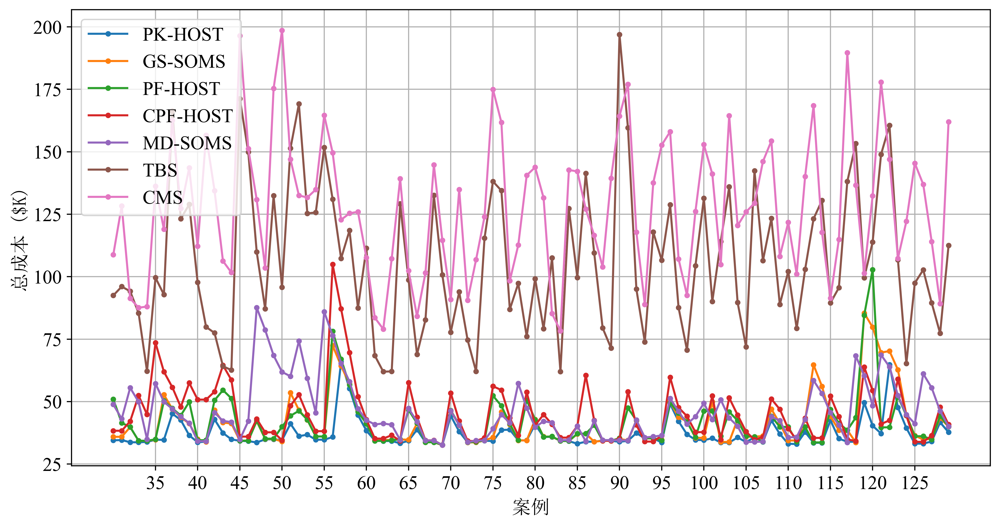

In [52]:
plt.figure(figsize=(12,6), dpi=500)
plt.plot(all_costs/1000, '-o', markersize=3) #'-o'是一个字符串，它表示线条的格式。其中，'-'表示实线，'o'表示圆形标记。这样做是为了在线条上显示每个数据点。
#markersize=3是一个关键字参数，它表示标记的大小。这里设置为3，表示较小的圆形。
plt.xlabel('案例', fontdict={"family": "SimSun"})
plt.ylabel('总成本 ($K)', fontdict={"family": "SimSun"})
plt.grid(True)   #.grid()是一个函数，它可以在绘图中添加网格线，以便于观察数据的分布和趋势
plt.xticks([i for i in range(5,len(all_costs),5)], 
           [i+30 for i in range(5,len(all_costs),5)], rotation=0)
plt.legend(all_costs.columns[:costs_arr.shape[-1]]) #.legend()是一个函数，它可以在绘图中添加图例，以便于区分不同的数据或线条。
# plt.savefig('Total cost of different methods.png',bbox_inches="tight") #.savefig()是一个函数，它可以将绘图保存为文件。这里将图保存为'Total cost of different methods

In [22]:
x = all_costs.drop(columns=['CPF-HOST','MD-SOMS']) #从all_costs的数据框中删除两列

 d:\python\Lib\site-packages\seaborn\categorical.py:1794: FutureWarning:use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
 d:\python\Lib\site-packages\seaborn\categorical.py:1794: FutureWarning:use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
 d:\python\Lib\site-packages\seaborn\categorical.py:1794: FutureWarning:use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
 d:\python\Lib\site-packages\seaborn\categorical.py:1794: FutureWarning:use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
 d:\python\Lib\site-packages\seaborn\categorical.py:1794: FutureWarning:use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


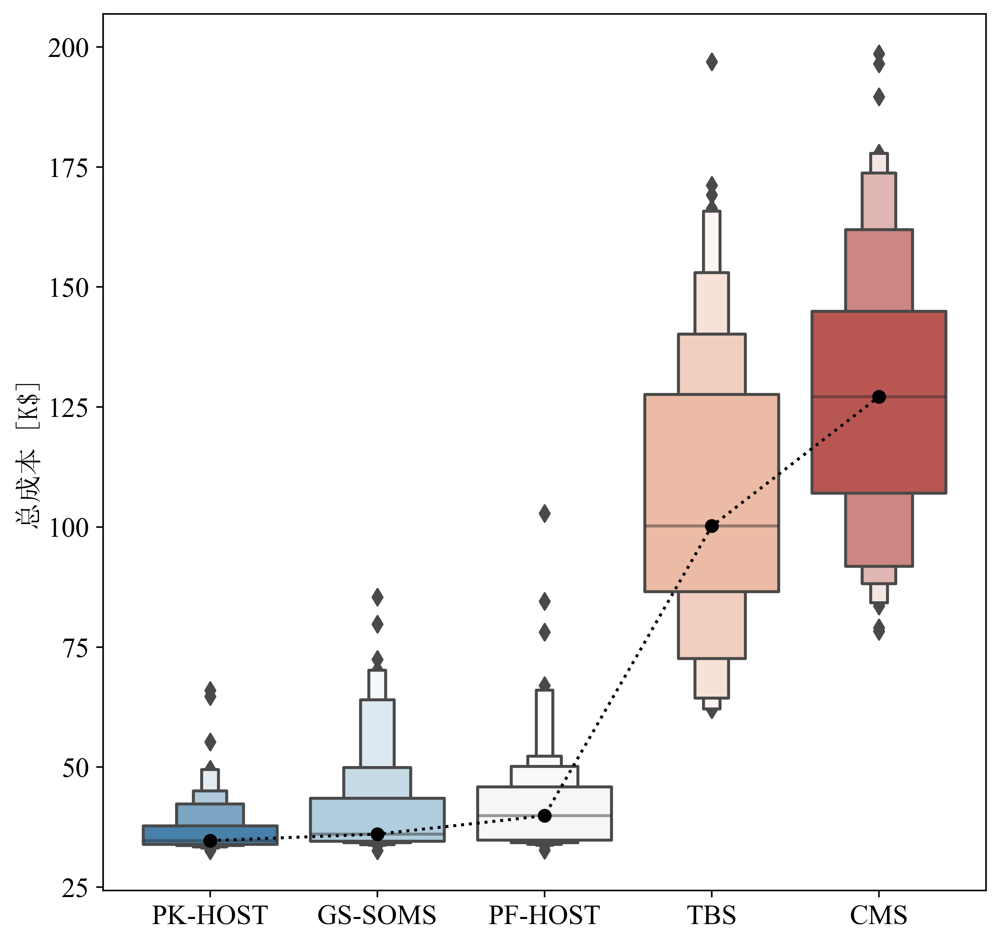

In [23]:
plt.figure(figsize=(8,8), dpi=500)
sns.boxenplot(data=x/1000, showfliers=True, k_depth = 'trustworthy', palette='RdBu_r') #绘制箱型图
#sns.swarmplot(data=all_costs/1000, color='k', size=2)

plt.ylabel('总成本 [K$]', fontdict={"family": "SimSun"})
_ = plt.xticks(range(0,x.shape[1]+0),x.columns) #x.shape[1]返回x的列数
plt.plot(np.arange(0,x.shape[1]+0),np.median(x,0)/1000,'o:',color='k') #plot方法是用来绘制折线图的，它接受四个参数，分别表示x轴的值，y轴的值，点和线的样式，和颜色。
#colors = ['pink', 'lightblue', 'lightgreen', 'red', 'blue']
#for patch, color in zip(bplot['boxes'], colors):
#    patch.set_facecolor(color)
# plt.savefig('Total cost by category with different methods.png',bbox_inches="tight")

In [24]:
x = all_costs.drop(columns=['TBS','CMS']) #从all_costs的数据框中删除两列

 d:\python\Lib\site-packages\seaborn\categorical.py:1794: FutureWarning:use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
 d:\python\Lib\site-packages\seaborn\categorical.py:1794: FutureWarning:use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
 d:\python\Lib\site-packages\seaborn\categorical.py:1794: FutureWarning:use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
 d:\python\Lib\site-packages\seaborn\categorical.py:1794: FutureWarning:use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
 d:\python\Lib\site-packages\seaborn\categorical.py:1794: FutureWarning:use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


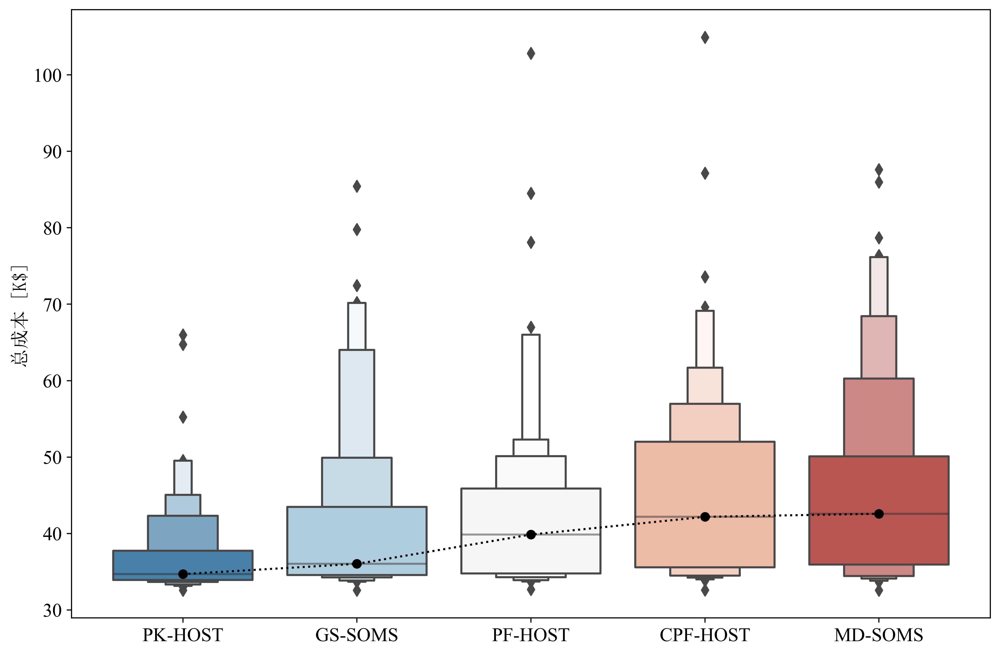

In [25]:
plt.figure(figsize=(12,8), dpi=500)
sns.boxenplot(data=x/1000, showfliers=True, k_depth = 'trustworthy', palette='RdBu_r') #绘制箱型图
#sns.swarmplot(data=all_costs/1000, color='k', size=2)

plt.ylabel('总成本 [K$]', fontdict={"family": "SimSun"})
_ = plt.xticks(range(0,x.shape[1]+0),x.columns) #x.shape[1]返回x的列数
plt.plot(np.arange(0,x.shape[1]+0),np.median(x,0)/1000,'o:',color='k') #plot方法是用来绘制折线图的，它接受四个参数，分别表示x轴的值，y轴的值，点和线的样式，和颜色。
#colors = ['pink', 'lightblue', 'lightgreen', 'red', 'blue']
#for patch, color in zip(bplot['boxes'], colors):
#    patch.set_facecolor(color)
# plt.savefig('Total cost by category with different SOMS-GS methods.png',bbox_inches="tight")

# 调度可视化

In [26]:
turbine=1
sample_num = 39
N_S=50
rolls = 8 



sample = 'sample '+str(sample_num)

wind_speed_forecast = wind_speed_NWP[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_forecast = wave_height_NWP[sample_num*24:(sample_num+rolls)*24]
wind_speed_real = wind_speed_true[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_real = wave_height_true[sample_num*24:(sample_num+rolls)*24]

#error_scenario_gen()
wind_scenarios = np.zeros((24*rolls,N_S))
wave_scenarios = np.zeros((24*rolls,N_S))
for i in range(rolls):
    ws_error_hist=wind_speed_NWP[:(sample_num+i)*24,turbine]-wind_speed_true[:(sample_num+i)*24,turbine]
    ws_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5,DGP=False,MLP=False,GS=True)
    wind_scenarios[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen
    
    
    wh_error_hist=wave_height_NWP[:(sample_num+i)*24]-wave_height_true[:(sample_num+i)*24]
    wh_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5,LDS=True,DGP=False,MLP=False,GS=True)
    wave_scenarios[24*i:24*(i+1),:] = np.repeat(wave_height_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-wh_error_scen
    
wind_scenarios[wind_scenarios<0.2]=0.2
wave_scenarios[wave_scenarios<0.1]=0.1


accessibility = np.ones_like(wave_scenarios)
accessibility[(wind_scenarios>=15) | (wave_scenarios>=1.8)] = 0
access=accessibility.reshape(-1,24,N_S)
access[:,:5,:] = 0
access[:,21:,:] = 0
    
N_t = accessibility.shape[1]
hrs, scn = np.where(accessibility==0)


access2 = np.ones(wind_speed_forecast.shape)
access3 = np.ones_like(access2)

access2[(wind_speed_forecast>=15) | (wave_height_forecast>=1.8)] = 0
access22=access2.reshape(-1,24).T
access22[:5,:] = 0
access22[21:,:] = 0

access3[(wind_speed_real>=15) | (wave_height_real>=1.8)] = 0
access33=access3.reshape(-1,24).T
access33[:5,:] = 0
access33[21:,:] = 0

hrs2 = np.where(access2==0)[0]
hrs3 = np.where(access3==0)[0]

Text(0.5, 1.0, 'GS-SOMS')

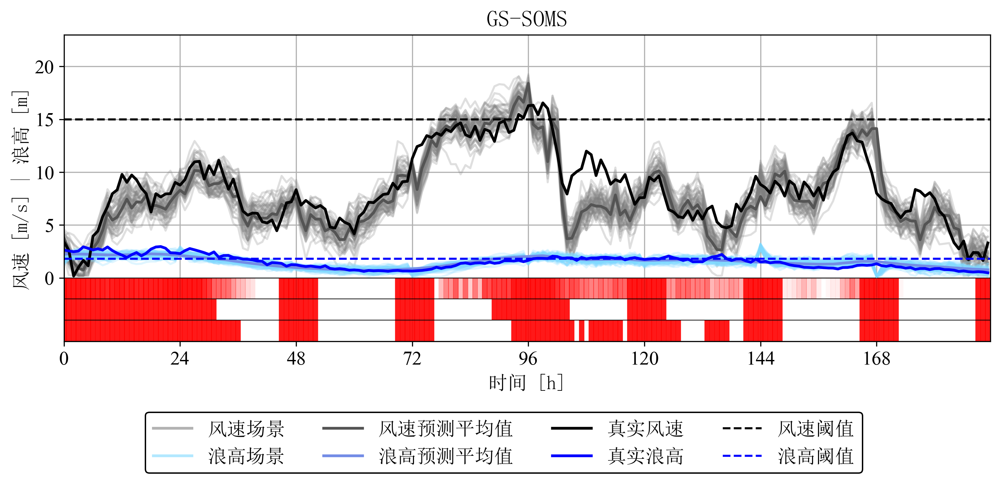

In [27]:
plt.figure(figsize=(12,4), dpi=300)

plt.plot(-1, 2, color='grey', alpha=0.6, linewidth=2) #wind speed scenarios
plt.plot(-1, 2, color=[0.5, 0.85, 1], alpha=0.6, linewidth=2) #wave height scenarios
plt.plot(-1, 2, color=[0.33,0.33,0.33], linewidth=2) #wind speed forecast mean
plt.plot(-1, 2, color=[0.45, 0.55, 0.9], linewidth=2) #wave height forecast mean
plt.plot(-1, 2, color='black', linewidth=2) #real wind speed
plt.plot(-1, 2, color='blue', linewidth=2) #real wave height
plt.plot(-1, 2, color='black', linestyle='--') #wind speed threshold
plt.plot(-1, 2, color='blue', linestyle='--') #wave height threshold
plt.legend(['风速场景','浪高场景','风速预测平均值','浪高预测平均值',
           '真实风速', '真实浪高', '风速阈值', '浪高阈值'], ncol=4, 
           loc='upper center', bbox_to_anchor=(0,0,0.95,-0.2), framealpha=1, edgecolor='k',prop={"family": "SimSun"})

plt.vlines(hrs,-2,-0, color='red', linewidth=3.9, alpha=1/25)
plt.vlines(hrs2,-4,-2, color='red', linewidth=3.9, alpha=0.9) #forecast accessibility
plt.vlines(hrs3,-6,-4, color='red', linewidth=3.9, alpha=0.9) #real accessibility

plt.plot([0, 24*rolls], [0, 0], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-2, -2], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-4, -4], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-6, -6], 'k', linewidth=0.5)



plt.plot(wind_scenarios, color='grey', alpha=0.25)
plt.plot(wind_speed_forecast, color=[0.33,0.33,0.33], linewidth=2)
plt.plot(wave_scenarios, color=[0.5, 0.85, 1], alpha=0.25)
plt.plot(wave_height_forecast, color=[0.45, 0.55, 0.9], linewidth=2)
plt.plot(wind_speed_real, color='black',linewidth=2)
plt.plot(wave_height_real, color='blue',linewidth=2)
plt.plot([0, 24*rolls],[15,15], color='black', linestyle='--')
plt.plot([0, 24*rolls],[1.8,1.8], color='blue', linestyle='--')
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True)
plt.xlabel('时间 [h]', fontdict={"family": "SimSun"})
plt.ylabel('风速 [m/s] | 浪高 [m]', fontdict={"family": "SimSun"})
plt.ylim([-6,23])
plt.yticks([0,5,10,15,20])
_=plt.xlim([0,rolls*24-0.5])
plt.title('GS-SOMS', fontdict={"family": "SimSun"})
# plt.savefig('IISE_paper_figures2.png', bbox_inches='tight', dpi=300)

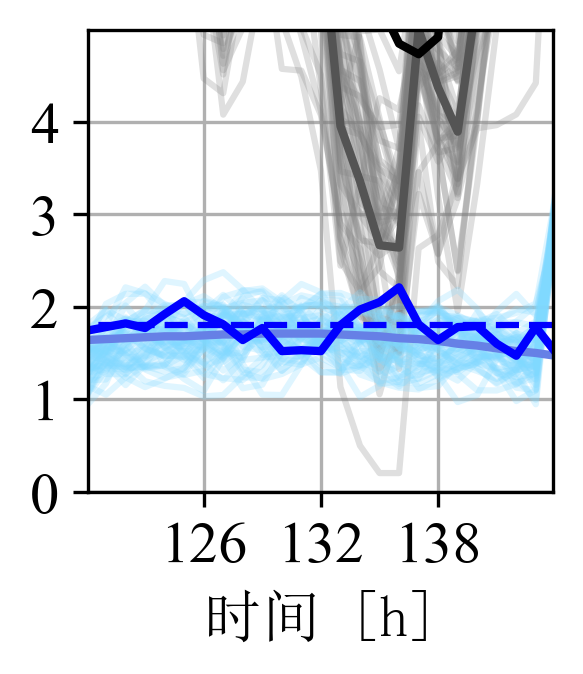

In [28]:
#绘制第5天插图
plt.figure(figsize=(2,2), dpi=300)


plt.vlines(hrs2,-4,-2, color='red', linewidth=3.9, alpha=0.9) #forecast accessibility
plt.vlines(hrs3,-6,-4, color='red', linewidth=3.9, alpha=0.9) #real accessibility

plt.plot([0, 24*rolls], [0, 0], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-2, -2], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-4, -4], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-6, -6], 'k', linewidth=0.5)



plt.plot(wind_scenarios, color='grey', alpha=0.25)
plt.plot(wind_speed_forecast, color=[0.33,0.33,0.33], linewidth=2)
plt.plot(wave_scenarios, color=[0.5, 0.85, 1], alpha=0.25)
plt.plot(wave_height_forecast, color=[0.40, 0.50, 0.9], linewidth=2)
plt.plot(wind_speed_real, color='black',linewidth=2)
plt.plot(wave_height_real, color='blue',linewidth=2)
plt.plot([0, 24*rolls],[15,15], color='black', linestyle='--')
plt.plot([0, 24*rolls],[1.8,1.8], color='blue', linestyle='--')
plt.xticks(np.arange(0,rolls*24,24/4), rotation=0)
plt.grid(True)
plt.xlabel('时间 [h]', fontdict={"family": "SimSun"})
#plt.ylabel('Wind speed [m/s] | Wave height [m]')

plt.yticks([0,1,2,3,4,10,15,20])
plt.ylim([0,5])
_=plt.xlim([120.1,143.9])



In [21]:
def show_full_schedule_simple(ax, solutions, sample, names, lw=19, return_schedule = False):
    """
    Generates a Gantt-chart for the STH schedule from all runs.
    
    Input:
    -ax: 要绘制的pyplot轴。
    -solutions: 一个包含所有基准解决方案的列表
    -sample: 使用样例解决方案的密钥进行绘制
    -names: 解决方案中每个基准测试的名称的字符串列表。
    -lw: 维护中断的线宽
    -return_schedule: bool; 如果为True，它还以numpy数组的形式返回完整的每小时时间表。
    """   
    
    #创建图例
    names.append('维护中断')
    hatches = ['....','////','OO','XXX','\\\\\\','++','oo']
    for method in range(len(solutions)):
        boxes = Rectangle((-1,1), 1, 1, fill=False, hatch=hatches[method], zorder=10)
        ax.add_patch(boxes)
    ax.hlines(-1, 1, 1, color=[0.9,0.5,0.4], linewidth=lw, alpha=1, zorder=1)
    
    ax.legend(names, ncol=[int((len(names)+1)/2) if len(names)+1>4 else len(names)][0],
              loc='upper center', bbox_to_anchor=(0,0,0.95,-0.28), framealpha=1, edgecolor='k',prop={"family": "SimSun"})
    names=names[:-1]
    
    #为每种方法创建时间表甘特图
    for method in range(len(solutions)):
        solution = solutions[method][sample]
        schedule = np.array(solution['simulation'][0]['STH_sched'])
        op_time = solution['true_input'][0][4]
        
        #首先将完整的小时时间表创建为numpy数组
        for i in range(1,len(solution['time_per_roll'])):
            schedule = np.append(schedule,np.array(solution['simulation'][i]['STH_sched']), 0)
            op_time = np.append(op_time, solution['true_input'][i][4],0)

        #作为numpy数组获得完整的真实每小时可访问性
        sol = solutions[method][sample]
        accessibility = sol['true_input'][0][6]

        for roll in range(1,len(solution['time_per_roll'])):
            accessibility = np.concatenate((accessibility, sol['true_input'][roll][6]),0)

        accessibility=accessibility[:,:,0]
        
        N_t = accessibility.shape[1]

        x = np.arange(schedule.shape[0])
        
        for i in range(N_t):
            
            y=i+method/len(solutions)+(1/len(solutions)-0.05)/2 #矩形的中心
            
            z = np.where(schedule[:,i]==1)[0]
            if np.sum(schedule[:,i])>1: #维护中断
                for j in range(int(np.sum(schedule[:,i]))-1):
                    plt.hlines(np.full(op_time[z[j],i,0], y),
                               x[z[j]:z[j]+op_time[z[j],i,0]]*(1-accessibility[z[j]:z[j]+op_time[z[j],i,0],i]),
                               (x[z[j]:z[j]+op_time[z[j],i,0]]+1.2)*(1-accessibility[z[j]:z[j]+op_time[z[j],i,0],i]),
                               color=[0.9,0.5,0.4], linewidth=lw, alpha=1, zorder=0)

                    plt.hlines(np.full(schedule.shape[0], y),
                               (z[j]+op_time[z[j],i,0]), z[j+1], color=[0.9,0.5,0.4], linewidth=lw, alpha=1, zorder=1)
                    
            x_time = np.where(schedule[:,i]==1)[0]
            #计算维护时间并构造矩形
            if x_time.shape[0]>1:
                maint_len = x[x_time[-1]]-x[x_time[0]]+op_time[x_time[-1],i,0]
            else:
                maint_len = op_time[x_time[0],i,0]
            boxes = Rectangle((x_time[0],i+method/len(solutions)), maint_len, 1/len(solutions)-0.05,
                           fill=False, hatch=hatches[method], zorder=10)
            ax.add_patch(boxes)
        
    return ax, schedule
    if return_schedule: return schedule

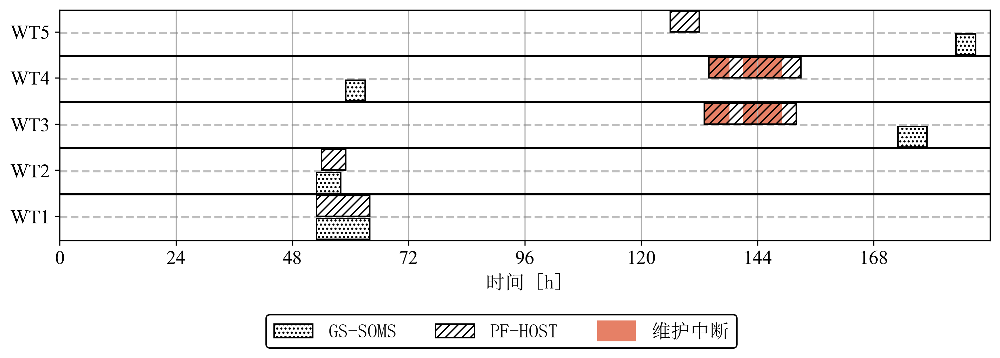

In [30]:
bench_idx = [1,2] #从full_sol_list中使用的基准的索引。在本例中，STOCHOS(1)和PF-HOST (2)
N_t=5
names=['GS-SOMS', 'PF-HOST']

fig, ax = plt.subplots(1, 1, figsize=(12,3), dpi=300)

show_full_schedule_simple(ax, [full_sol_list[i] for i in bench_idx], sample, 
                          names=names, lw=15)

plt.yticks([i+0.5 for i in range(N_t)],['WT'+str(i+1) for i in range(N_t)])
plt.xlim([0,rolls*24])
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True, axis='x')
_=plt.xlabel('时间 [h]', fontdict={"family": "SimSun"})
plt.ylim([-0.025,N_t-0.025])

num_methods=len([bench_names[i] for i in bench_idx])
for i in range(N_t):
    plt.hlines(i+1-0.025, 0, rolls*24, 'k' )
    for j in range(1,num_methods):
        plt.hlines(i+np.linspace(0,1,num_methods+1)[j]-0.025, 0, rolls*24, 'grey', 
                   alpha=0.5, linestyle='--')

In [35]:
#另一个有更多基准的例子
turbine=1
sample_num = 100
N_S=50
rolls = 5

In [ ]:
sample = 'sample '+str(sample_num)

wind_speed_forecast = wind_speed_NWP[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_forecast = wave_height_NWP[sample_num*24:(sample_num+rolls)*24]
wind_speed_real = wind_speed_true[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_real = wave_height_true[sample_num*24:(sample_num+rolls)*24]

#error_scenario_gen()
wind_scenarios = np.zeros((24*rolls,N_S))
wave_scenarios = np.zeros((24*rolls,N_S))
for i in range(rolls):
    ws_error_hist=wind_speed_NWP[:(sample_num+i)*24,turbine]-wind_speed_true[:(sample_num+i)*24,turbine]
    ws_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5,GS=True)
    wind_scenarios[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen
    
    
    wh_error_hist=wave_height_NWP[:(sample_num+i)*24]-wave_height_true[:(sample_num+i)*24]
    wh_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5,LDS=True,GS=True)
    wave_scenarios[24*i:24*(i+1),:] = np.repeat(wave_height_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-wh_error_scen
    
wind_scenarios[wind_scenarios<0.2]=0.2
wave_scenarios[wave_scenarios<0.1]=0.1

accessibility = np.ones_like(wave_scenarios)
accessibility[(wind_scenarios>=15) | (wave_scenarios>=1.8)] = 0
access=accessibility.reshape(-1,24,N_S)
access[:,:5,:] = 0
access[:,21:,:] = 0
    
N_t = accessibility.shape[1]
hrs, scn = np.where(accessibility==0)


access2 = np.ones(wind_speed_forecast.shape)
access3 = np.ones_like(access2)

access2[(wind_speed_forecast>=15) | (wave_height_forecast>=1.8)] = 0
access22=access2.reshape(-1,24).T
access22[:5,:] = 0
access22[21:,:] = 0

access3[(wind_speed_real>=15) | (wave_height_real>=1.8)] = 0
access33=access3.reshape(-1,24).T
access33[:5,:] = 0
access33[21:,:] = 0

hrs2 = np.where(access2==0)[0]
hrs3 = np.where(access3==0)[0]

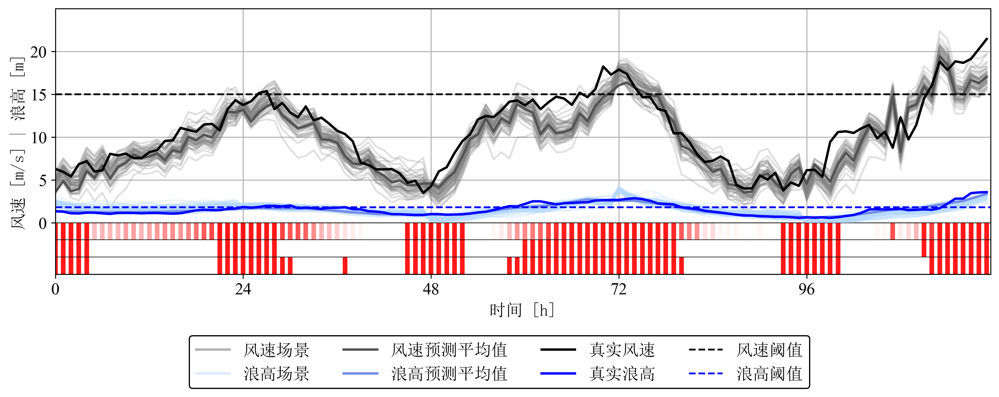

In [33]:
plt.figure(figsize=(14,4), dpi=300)

plt.plot(-1, 2, color='grey', alpha=0.6, linewidth=2) #wind speed scenarios
plt.plot(-1, 2, color=[0.8, 0.85, 1], alpha=0.6, linewidth=2) #wave height scenarios
plt.plot(-1, 2, color=[0.33,0.33,0.33], linewidth=2) #wind speed forecast mean
plt.plot(-1, 2, color=[0.45, 0.55, 0.9], linewidth=2) #wave height forecast mean
plt.plot(-1, 2, color='black', linewidth=2) #real wind speed
plt.plot(-1, 2, color='blue', linewidth=2) #real wave height
plt.plot(-1, 2, color='black', linestyle='--') #wind speed threshold
plt.plot(-1, 2, color='blue', linestyle='--') #wave height threshold
plt.legend(['风速场景','浪高场景','风速预测平均值','浪高预测平均值',
           '真实风速', '真实浪高', '风速阈值', '浪高阈值'], ncol=4, 
           loc='upper center', bbox_to_anchor=(0,0,0.95,-0.2), framealpha=1, edgecolor='k',prop={"family": "SimSun"})


plt.vlines(hrs,-2,-0, color='red', linewidth=3.9, alpha=1/25) #scenario accessibility
plt.vlines(hrs2,-4,-2, color='red', linewidth=3.9, alpha=0.9) #forecast accessibility
plt.vlines(hrs3,-6,-4, color='red', linewidth=3.9, alpha=0.9) #real accessibility

plt.plot([0, 24*rolls], [0, 0], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-2, -2], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-4, -4], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-6, -6], 'k', linewidth=0.5)



plt.plot(wind_scenarios, color='grey', alpha=0.25)
plt.plot(wind_speed_forecast, color=[0.33,0.33,0.33], linewidth=2)
plt.plot(wave_scenarios, color=[0.7, 0.85, 1], alpha=0.25)
plt.plot(wave_height_forecast, color=[0.45, 0.55, 0.9], linewidth=2)
plt.plot(wind_speed_real, color='black',linewidth=2)
plt.plot(wave_height_real, color='blue',linewidth=2)
plt.plot([0, 24*rolls],[15,15], color='black', linestyle='--')
plt.plot([0, 24*rolls],[1.8,1.8], color='blue', linestyle='--')
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True)
plt.xlabel('时间 [h]', fontdict={"family": "SimSun"})
plt.ylabel('风速 [m/s] | 浪高 [m]', fontdict={"family": "SimSun"})
plt.ylim([-6,25])
plt.yticks([0,5,10,15,20])
_=plt.xlim([0,rolls*24-0.5])



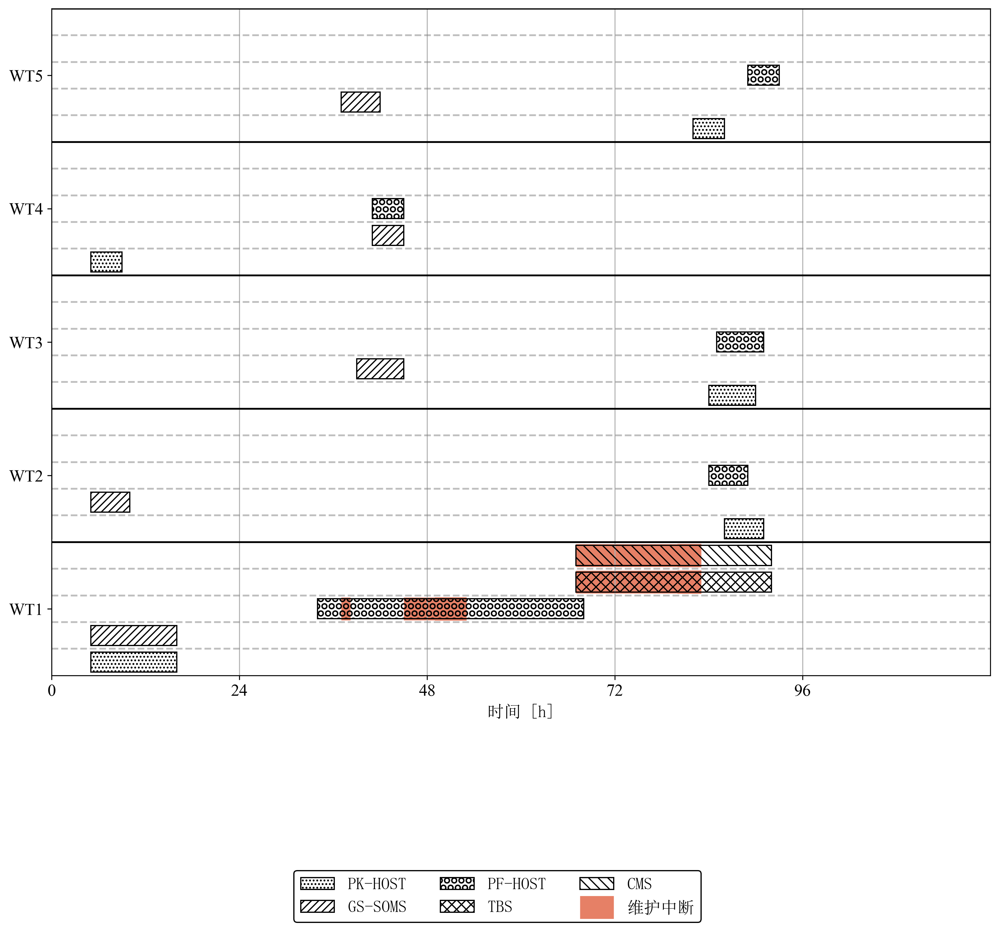

In [34]:
bench_idx = [0,1,2,-2,-1]
N_t=5

#bench_bool = list(np.isin(np.arange(len(bench_names)),bench_idx))

fig, ax = plt.subplots(1, 1, figsize=(14,10), dpi=300)

#plt.plot(-10,1, 'ks', markersize=12, alpha=1) #Scheduled maintenance
#plt.plot(-10,1, 's', color=[0.9,0.5,0.4] , markersize=12, alpha=1) #Scheduled maintenance
#plt.plot(-10,1, color='orange', linewidth=3,alpha=1) #Residual life (actual)
#plt.plot(-10,1, color='red', linewidth=2, alpha=1 if i==1 else 0.4) #Residual life (estimate)
show_full_schedule_simple(ax, [full_sol_list[i] for i in bench_idx], sample, 
                          [bench_names[i] for i in bench_idx], lw=19)

#plt.title(bench_names[i])
plt.yticks([i+0.5-0.025 for i in range(N_t)],['WT'+str(i+1) for i in range(N_t)])
plt.xlim([0,rolls*24])
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True, axis='x')
_=plt.xlabel('时间 [h]', fontdict={"family": "SimSun"})
plt.ylim([-0.025,N_t-0.025])

num_methods=len([bench_names[i] for i in bench_idx])
for i in range(N_t):
    plt.hlines(i+1-0.025, 0, rolls*24, 'k' )
    for j in range(1,num_methods):
        plt.hlines(i+np.linspace(0,1,num_methods+1)[j]-0.025, 0, rolls*24, 'grey', 
                   alpha=0.5, linestyle='--')

In [ ]:
#每个样本都是一个包含有用信息的字典。
num = 116
for i in range(len(deterministic_true_sols[f'sample {num}']['simulation'])):
    print(deterministic_true_sols[f'sample {num}']['simulation'][i]['remaining_maint_hrs'])
print("##########################")
for i in range(len(deterministic_NWP_sols[f'sample {num}']['simulation'])):
    print(deterministic_NWP_sols[f'sample {num}']['simulation'][i]['remaining_maint_hrs'])    
print("##########################")
for i in range(len(GS[f'sample {num}']['simulation'])):
    print(GS[f'sample {num}']['simulation'][i]['remaining_maint_hrs'])

In [9]:
turbine=1
sample_num = 116
method_num=1
N_S=50
rolls = 24

In [ ]:
 #原始场景生成

sample = 'sample '+str(sample_num)

'''ws_scenarios = full_sol_list[method_num][sample]['stochastic_input'][0][7][:,turbine,:]
wh_scenarios = full_sol_list[method_num][sample]['stochastic_input'][0][8]
for roll in range(1,rolls):
    ws_scenarios = np.concatenate((ws_scenarios, full_sol_list[method_num][sample]['stochastic_input'][roll][7][:,turbine,:]),0)
    wh_scenarios = np.concatenate((wh_scenarios, full_sol_list[method_num][sample]['stochastic_input'][roll][8]),0)
'''

wind_speed_forecast = wind_speed_NWP[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_forecast = wave_height_NWP[sample_num*24:(sample_num+rolls)*24]
wind_speed_real = wind_speed_true[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_real = wave_height_true[sample_num*24:(sample_num+rolls)*24]

#error_scenario_gen()
wind_scenarios = np.zeros((24*rolls,N_S))
wave_scenarios = np.zeros((24*rolls,N_S))
for i in range(rolls):
    ws_error_hist=wind_speed_NWP[:(sample_num+i)*24,turbine]-wind_speed_true[:(sample_num+i)*24,turbine]
    ws_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5)
    wind_scenarios[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen
    
    
    wh_error_hist=wave_height_NWP[:(sample_num+i)*24]-wave_height_true[:(sample_num+i)*24]
    wh_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5,LDS=True)
    wave_scenarios[24*i:24*(i+1),:] = np.repeat(wave_height_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-wh_error_scen
    
wind_scenarios[wind_scenarios<0.2]=0.2
wave_scenarios[wave_scenarios<0.1]=0.1


plt.figure(figsize=(14,4), dpi=300)

plt.plot(-1, 2, color='grey', alpha=0.6, linewidth=2) #wind speed scenarios
plt.plot(-1, 2, color=[0.8, 0.85, 1], alpha=0.6, linewidth=2) #wave height scenarios
plt.plot(-1, 2, color=[0.33,0.33,0.33], linewidth=2) #wind speed forecast mean
plt.plot(-1, 2, color=[0.45, 0.55, 0.9], linewidth=2) #wave height forecast mean
plt.plot(-1, 2, color='black', linewidth=2) #real wind speed
plt.plot(-1, 2, color='blue', linewidth=2) #real wave height
plt.plot(-1, 2, color='black', linestyle='--') #wind speed threshold
plt.plot(-1, 2, color='blue', linestyle='--') #wave height threshold
plt.legend(['风速场景','浪高场景','风速预测平均值','浪高预测平均值',
           '真实风速', '真实浪高', '风速阈值', '浪高阈值'], ncol=4, 
           loc='upper center', bbox_to_anchor=(0,0,0.95,-0.2), framealpha=1, edgecolor='k',prop={"family": "SimSun"})





accessibility = np.ones_like(wave_scenarios)
accessibility[(wind_scenarios>=15) | (wave_scenarios>=1.8)] = 0
access=accessibility.reshape(-1,24,N_S)
access[:,:5,:] = 0
access[:,21:,:] = 0
    
N_t = accessibility.shape[1]
hrs, scn = np.where(accessibility==0)

plt.vlines(hrs,-2,-0, color='red', linewidth=3.9, alpha=1/25)

access2 = np.ones(wind_speed_forecast.shape)
access3 = np.ones_like(access2)

access2[(wind_speed_forecast>=15) | (wave_height_forecast>=1.8)] = 0
access22=access2.reshape(-1,24).T
access22[:5,:] = 0
access22[21:,:] = 0

access3[(wind_speed_real>=15) | (wave_height_real>=1.8)] = 0
access33=access3.reshape(-1,24).T
access33[:5,:] = 0
access33[21:,:] = 0

hrs2 = np.where(access2==0)[0]
hrs3 = np.where(access3==0)[0]

plt.vlines(hrs2,-4,-2, color='red', linewidth=3.9, alpha=0.9) #forecast accessibility
plt.vlines(hrs3,-6,-4, color='red', linewidth=3.9, alpha=0.9) #real accessibility

plt.plot([0, 24*rolls], [0, 0], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-2, -2], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-4, -4], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-6, -6], 'k', linewidth=0.5)



plt.plot(wind_scenarios, color='grey', alpha=0.25)
plt.plot(wind_speed_forecast, color=[0.33,0.33,0.33], linewidth=2)
plt.plot(wave_scenarios, color=[0.7, 0.85, 1], alpha=0.25)
plt.plot(wave_height_forecast, color=[0.45, 0.55, 0.9], linewidth=2)
plt.plot(wind_speed_real, color='black',linewidth=2)
plt.plot(wave_height_real, color='blue',linewidth=2)
plt.plot([0, 24*rolls],[15,15], color='black', linestyle='--')
plt.plot([0, 24*rolls],[1.8,1.8], color='blue', linestyle='--')
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True)
plt.xlabel('时间 [h]', fontdict={"family": "SimSun"})
plt.ylabel('风速 [m/s] | 浪高 [m]', fontdict={"family": "SimSun"})
plt.ylim([-6,25])
plt.yticks([0,5,10,15,20])
_=plt.xlim([0,rolls*24-0.5])



In [ ]:
 #NAIVE STOCHOS scenarios

sample = 'sample '+str(sample_num)

'''ws_scenarios = full_sol_list[method_num][sample]['stochastic_input'][0][7][:,turbine,:]
wh_scenarios = full_sol_list[method_num][sample]['stochastic_input'][0][8]
for roll in range(1,rolls):
    ws_scenarios = np.concatenate((ws_scenarios, full_sol_list[method_num][sample]['stochastic_input'][roll][7][:,turbine,:]),0)
    wh_scenarios = np.concatenate((wh_scenarios, full_sol_list[method_num][sample]['stochastic_input'][roll][8]),0)
'''

wind_speed_forecast = wind_speed_NWP[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_forecast = wave_height_NWP[sample_num*24:(sample_num+rolls)*24]
wind_speed_real = wind_speed_true[sample_num*24:(sample_num+rolls)*24,turbine]
wave_height_real = wave_height_true[sample_num*24:(sample_num+rolls)*24]

#error_scenario_gen()
wind_scenarios = np.zeros((24*rolls,N_S))
wave_scenarios = np.zeros((24*rolls,N_S))
for i in range(rolls):
    ws_error_hist=wind_speed_NWP[:(sample_num+i)*24,turbine]-wind_speed_true[:(sample_num+i)*24,turbine]
    ws_error_scen = np.random.normal(loc=np.zeros((24,1)),
                                scale=np.full((24,1),ws_error_hist.std()),size=(24,N_S))
    wind_scenarios[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen
    
    
    wh_error_hist=wave_height_NWP[:(sample_num+i)*24]-wave_height_true[:(sample_num+i)*24]
    wh_error_scen = np.random.normal(loc=np.zeros((24,1)),
                                scale=np.full((24,1),wh_error_hist.std()),size=(24,N_S))
    wave_scenarios[24*i:24*(i+1),:] = np.repeat(wave_height_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-wh_error_scen
    
wind_scenarios[wind_scenarios<0.2]=0.2
wave_scenarios[wave_scenarios<0.1]=0.1


plt.figure(figsize=(14,4), dpi=300)

plt.plot(-1, 2, color='grey', alpha=0.6, linewidth=2) #wind speed scenarios
plt.plot(-1, 2, color=[0.8, 0.85, 1], alpha=0.6, linewidth=2) #wave height scenarios
plt.plot(-1, 2, color=[0.33,0.33,0.33], linewidth=2) #wind speed forecast mean
plt.plot(-1, 2, color=[0.45, 0.55, 0.9], linewidth=2) #wave height forecast mean
plt.plot(-1, 2, color='black', linewidth=2) #real wind speed
plt.plot(-1, 2, color='blue', linewidth=2) #real wave height
plt.plot(-1, 2, color='black', linestyle='--') #wind speed threshold
plt.plot(-1, 2, color='blue', linestyle='--') #wave height threshold
plt.legend(['Wind speed scenarios','Wave height scenarios','Wind speed forecast mean','Wave height forecast mean',
           'Real wind speed', 'Real wave height', 'Wind speed threshold', 'Wave height threshold'], ncol=4, 
           loc='upper center', bbox_to_anchor=(0,0,0.95,-0.2), framealpha=1, edgecolor='k')





accessibility = np.ones_like(wave_scenarios)
accessibility[(wind_scenarios>=15) | (wave_scenarios>=1.8)] = 0
access=accessibility.reshape(-1,24,N_S)
access[:,:5,:] = 0
access[:,21:,:] = 0
    
N_t = accessibility.shape[1]
hrs, scn = np.where(accessibility==0)

plt.vlines(hrs,-2,-0, color='red', linewidth=3.9, alpha=1/25)

access2 = np.ones(wind_speed_forecast.shape)
access3 = np.ones_like(access2)

access2[(wind_speed_forecast>=15) | (wave_height_forecast>=1.8)] = 0
access22=access2.reshape(-1,24).T
access22[:5,:] = 0
access22[21:,:] = 0

access3[(wind_speed_real>=15) | (wave_height_real>=1.8)] = 0
access33=access3.reshape(-1,24).T
access33[:5,:] = 0
access33[21:,:] = 0

hrs2 = np.where(access2==0)[0]
hrs3 = np.where(access3==0)[0]

plt.vlines(hrs2,-4,-2, color='red', linewidth=3.9, alpha=0.9) #forecast accessibility
plt.vlines(hrs3,-6,-4, color='red', linewidth=3.9, alpha=0.9) #real accessibility

plt.plot([0, 24*rolls], [0, 0], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-2, -2], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-4, -4], 'k', linewidth=0.5)
plt.plot([0, 24*rolls], [-6, -6], 'k', linewidth=0.5)



plt.plot(wind_scenarios, color='grey', alpha=0.25)
plt.plot(wind_speed_forecast, color=[0.33,0.33,0.33], linewidth=2)
plt.plot(wave_scenarios, color=[0.7, 0.85, 1], alpha=0.25)
plt.plot(wave_height_forecast, color=[0.45, 0.55, 0.9], linewidth=2)
plt.plot(wind_speed_real, color='black',linewidth=2)
plt.plot(wave_height_real, color='blue',linewidth=2)
plt.plot([0, 24*rolls],[15,15], color='black', linestyle='--')
plt.plot([0, 24*rolls],[1.8,1.8], color='blue', linestyle='--')
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True)
plt.xlabel('Time [h]')
plt.ylabel('Wind speed [m/s] | Wave height [m]')
plt.ylim([-6,25])
plt.yticks([0,5,10,15,20])
_=plt.xlim([0,rolls*24-0.5])



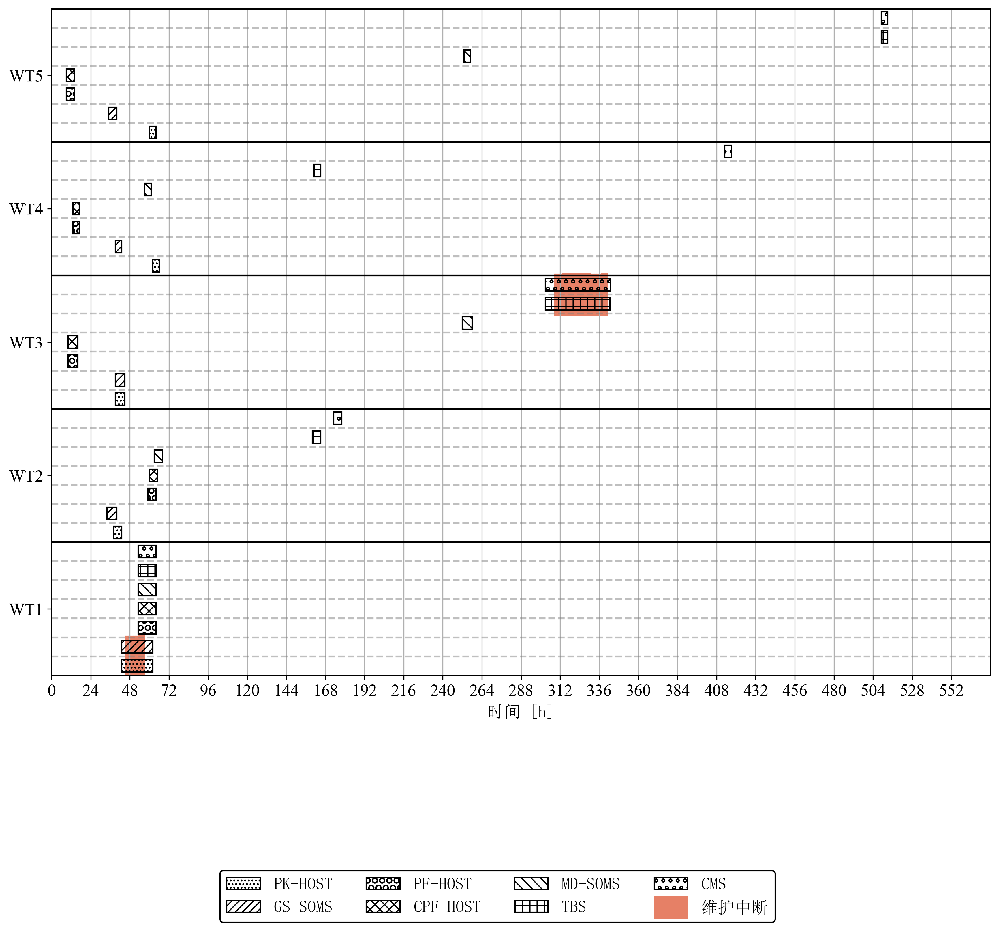

In [23]:
bench_idx = [0,1,2,3,4,5,6]
N_t=5

#bench_bool = list(np.isin(np.arange(len(bench_names)),bench_idx))

fig, ax = plt.subplots(1, 1, figsize=(14,10), dpi=300)

#plt.plot(-10,1, 'ks', markersize=12, alpha=1) #Scheduled maintenance
#plt.plot(-10,1, 's', color=[0.9,0.5,0.4] , markersize=12, alpha=1) #Scheduled maintenance
#plt.plot(-10,1, color='orange', linewidth=3,alpha=1) #Residual life (actual)
#plt.plot(-10,1, color='red', linewidth=2, alpha=1 if i==1 else 0.4) #Residual life (estimate)
show_full_schedule_simple(ax, [full_sol_list[i] for i in bench_idx], sample, 
                          [bench_names[i] for i in bench_idx], lw=19)

#plt.title(bench_names[i])
plt.yticks([i+0.5-0.025 for i in range(N_t)],['WT'+str(i+1) for i in range(N_t)])
plt.xlim([0,rolls*24])
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True, axis='x')
_=plt.xlabel('时间 [h]', fontdict={"family": "SimSun"})
plt.ylim([-0.025,N_t-0.025])

num_methods=len([bench_names[i] for i in bench_idx])
for i in range(N_t):
    plt.hlines(i+1-0.025, 0, rolls*24, 'k' )
    for j in range(1,num_methods):
        plt.hlines(i+np.linspace(0,1,num_methods+1)[j]-0.025, 0, rolls*24, 'grey', 
                   alpha=0.5, linestyle='--')

#plt.legend(['Scheduled maintenance', 'Maintenance interruption'], ncol=2,
#                  loc='upper center', bbox_to_anchor=(0,0,0.95,-0.28), framealpha=1, edgecolor='k')

# 收入概况可视化

In [10]:
prices_forecasts = pd.read_csv('True_n_LEAR_el_prices_da_comed.csv', index_col=[0])
sample_num = 39
N_S=50
rolls = 24 
turbine=1
sample = 'sample '+str(sample_num)

In [13]:
wind_speed_forecast = wind_speed_NWP[sample_num*24:(sample_num+rolls)*24,turbine]
wind_speed_real = wind_speed_true[sample_num*24:(sample_num+rolls)*24,turbine]

el_price_forecast = np.array(prices_forecasts['LEAR 56'])[sample_num*24:(sample_num+rolls)*24]
el_price_real = np.array(prices_forecasts['Real price'])[sample_num*24:(sample_num+rolls)*24]

#error_scenario_gen()
wind_scenarios = np.zeros((24*rolls,N_S))
wind_scenarios_naive = np.zeros((24*rolls,N_S))

price_scenarios = np.zeros((24*rolls,N_S))
price_scenarios_naive = np.zeros((24*rolls,N_S))

for i in range(rolls):
    ws_error_hist=wind_speed_NWP[:(sample_num+i)*24,turbine]-wind_speed_true[:(sample_num+i)*24,turbine]
    ws_error_scen = error_scenario_gen(ws_error_hist,24,N_S,24*5,GS=True)
    wind_scenarios[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen
    
    ep_error_hist= np.array(prices_forecasts['LEAR 56'])[:(sample_num+i)*24]-np.array(
        prices_forecasts['Real price'])[:(sample_num+i)*24]
    ep_error_scen = error_scenario_gen(ep_error_hist,24,N_S,24*5,GS=True)
    price_scenarios[24*i:24*(i+1),:] = np.repeat(el_price_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ep_error_scen

    ws_error_scen2 = np.random.normal(loc=np.zeros((24,1)),
                                scale=np.full((24,1),ws_error_hist.std()),size=(24,N_S))
    wind_scenarios_naive[24*i:24*(i+1),:] = np.repeat(wind_speed_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ws_error_scen2
    
    ep_error_hist= np.array(prices_forecasts['LEAR 56'])[:(sample_num+i)*24]-np.array(
        prices_forecasts['Real price'])[:(sample_num+i)*24]
    ep_error_scen2 = error_scenario_gen(ep_error_hist,24,N_S,24*5,GS=True)
    price_scenarios_naive[24*i:24*(i+1),:] = np.repeat(el_price_forecast[24*i:24*(i+1),np.newaxis],N_S,-1)-ep_error_scen2
    
power_original = binning_method(wind_scenarios)*12
power_naive = binning_method(wind_scenarios_naive)*12
power_pf = binning_method(wind_speed_forecast)*12
power_true = binning_method(wind_speed_real)*12

revenue_original = power_original*price_scenarios
revenue_naive = power_naive*price_scenarios_naive
revenue_pf = power_pf*el_price_forecast
revenue_real = power_true*el_price_real

 d:\python\Lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning:lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
 d:\python\Lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning:lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
 d:\python\Lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning:lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
 d:\python\Lib\site-packages\sklearn\gaussian_process\_gpr.py:663: ConvergenceWarning:lbfgs failed to converge (sta

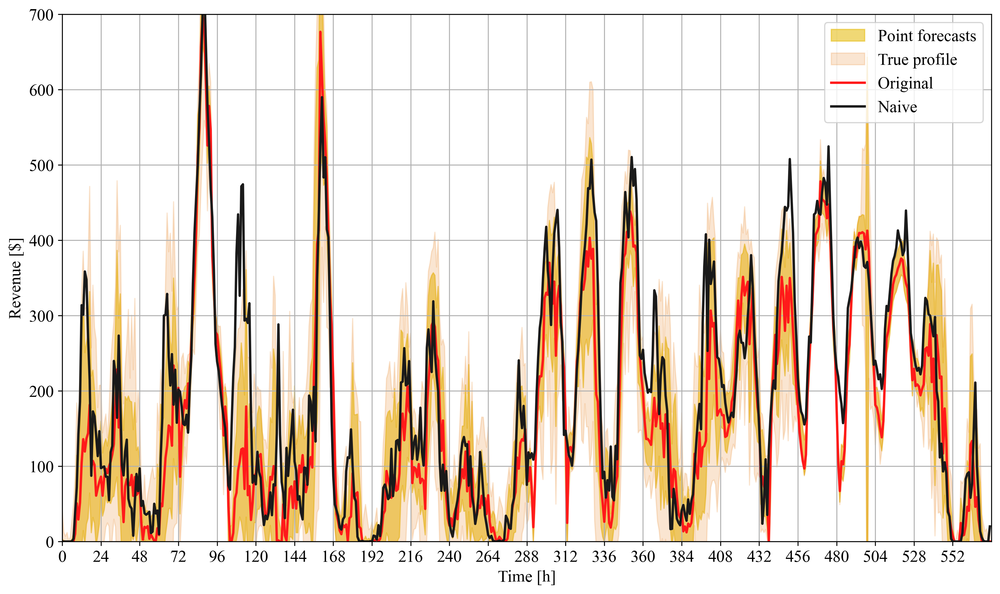

In [14]:
plt.figure(figsize=(14,8), dpi=300)

plt.fill_between(np.arange(revenue_original.shape[0]),
                 revenue_original.mean(1)+2*revenue_original.std(1),
                 revenue_original.mean(1)-2*revenue_original.std(1),color=[0.9,0.75,0.1], alpha = 0.6)
plt.fill_between(np.arange(revenue_naive.shape[0]),
                 revenue_naive.mean(1)+2*revenue_naive.std(1),
                 revenue_naive.mean(1)-2*revenue_naive.std(1),color=[0.9,0.5,0.1], alpha = 0.2)
plt.plot(revenue_pf,color=[1,0.1,0.1], alpha = 1, linewidth=2)
plt.plot(revenue_real,color=[0.1,0.1,0.1], alpha = 1, linewidth=2)
plt.xlim([0,revenue_original.shape[0]])
plt.ylim([0,700])
plt.legend(['Point forecasts','True profile','Original','Naive'])
plt.xlabel('Time [h]')
_=plt.ylabel('Revenue [$]')
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True)

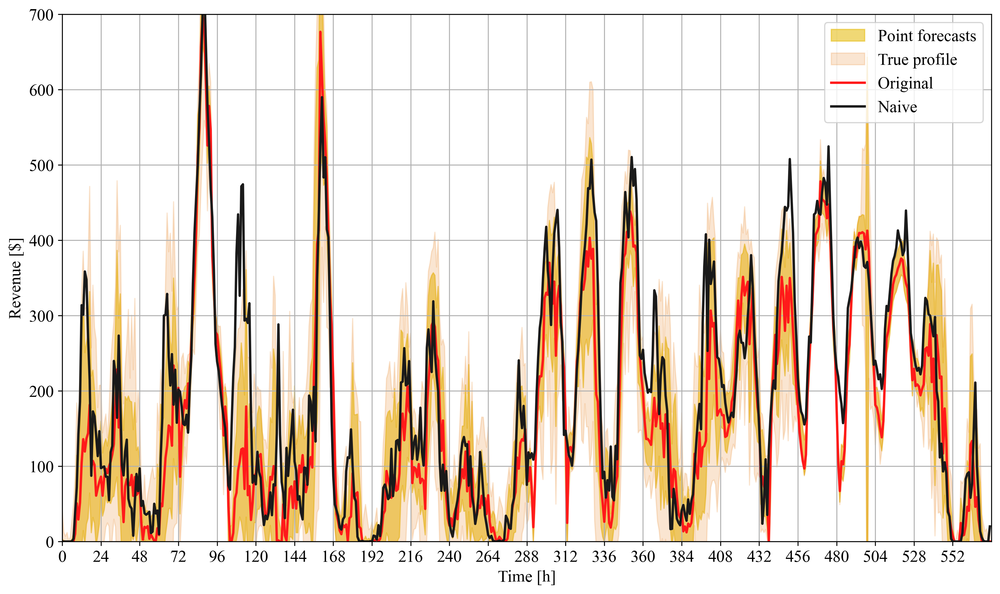

In [15]:
plt.figure(figsize=(14,8), dpi=300)

plt.fill_between(np.arange(revenue_original.shape[0]),
                 revenue_original.mean(1)+2*revenue_original.std(1),
                 revenue_original.mean(1)-2*revenue_original.std(1),color=[0.9,0.75,0.1], alpha = 0.6)
plt.fill_between(np.arange(revenue_naive.shape[0]),
                 revenue_naive.mean(1)+2*revenue_naive.std(1),
                 revenue_naive.mean(1)-2*revenue_naive.std(1),color=[0.9,0.5,0.1], alpha = 0.2)
plt.plot(revenue_pf,color=[1,0.1,0.1], alpha = 1, linewidth=2)
plt.plot(revenue_real,color=[0.1,0.1,0.1], alpha = 1, linewidth=2)
plt.xlim([0,revenue_original.shape[0]])
plt.ylim([0,700])
plt.legend(['Point forecasts','True profile','Original','Naive'])
plt.xlabel('Time [h]')
_=plt.ylabel('Revenue [$]')
plt.xticks(np.arange(0,rolls*24,24), rotation=0)
plt.grid(True)

# 操作数据和预测可视化

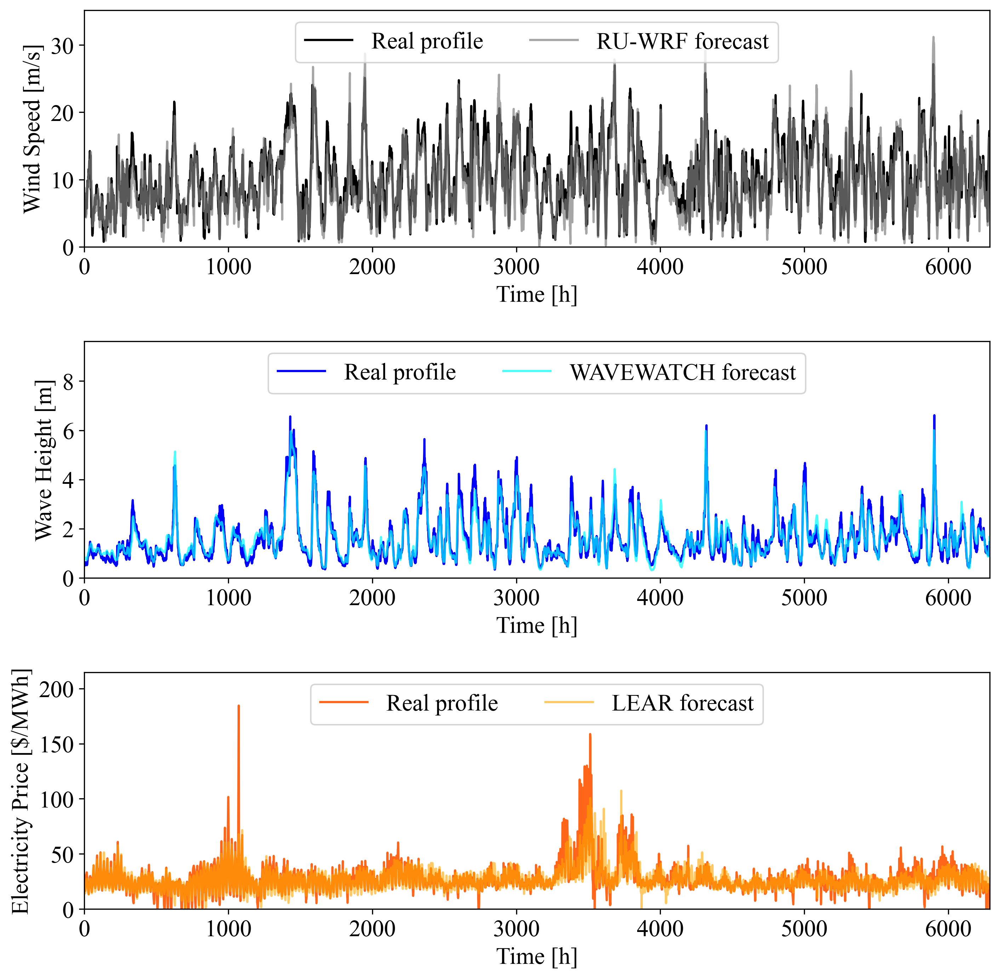

In [171]:
fnt = {'fontname':'Times New Roman'}
plt.rc('font',family='Times New Roman',size=16)


fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(11,11), dpi=300)
#plt.tight_layout()

ax1.plot(np.array(weather_ocean_data_df['NYE05.wind_speed_100m']), color='black')
ax1.plot(np.array(weather_ocean_data_df['RUWRF.wind_speed_100m']), color='grey', alpha=0.7)
ax1.set_ylabel('Wind Speed [m/s]')
ax1.set_xlabel('Time [h]')
ax1.set_ylim([0,weather_ocean_data_df['NYE05.wind_speed_100m'].max()+8])
ax1.set_xlim([0,weather_ocean_data_df.shape[0]])
ax1.legend(['Real profile', 'RU-WRF forecast'], ncol=2, loc='upper center')
plt.subplots_adjust(hspace = 0.4)

ax2.plot(np.array(weather_ocean_data_df['NYE05.wave_height']), color='blue')
ax2.plot(np.array(weather_ocean_data_df['NOAA.wave_height']), color='cyan', alpha=0.7)
ax2.set_ylabel('Wave Height [m]')
ax2.set_xlabel('Time [h]')
ax2.set_ylim([0,weather_ocean_data_df['NYE05.wave_height'].max()+3])
ax2.set_xlim([0,weather_ocean_data_df.shape[0]])
ax2.legend(['Real profile', 'WAVEWATCH forecast'], ncol=2, loc='upper center')

ax3.plot(np.array(prices_forecasts['Real price']), color=[1, 0.4, 0.1])
ax3.plot(np.array(prices_forecasts['LEAR 56']), color='orange', alpha=0.6)
ax3.set_ylabel('Electricity Price [$/MWh]')
ax3.set_xlabel('Time [h]')
ax3.set_ylim([0,prices_forecasts['Real price'].max()+30])
ax3.set_xlim([0,weather_ocean_data_df.shape[0]])
ax3.legend(['Real profile', 'LEAR forecast'], ncol=2, loc='upper center')

 C:\Users\26836\AppData\Local\Temp\ipykernel_21816\777939802.py:3: UserWarning:

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

 d:\python\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
 C:\Users\26836\AppData\Local\Temp\ipykernel_21816\777939802.py:9: UserWarning:

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use t

Text(0.5, 1.0, 'Electricity price')

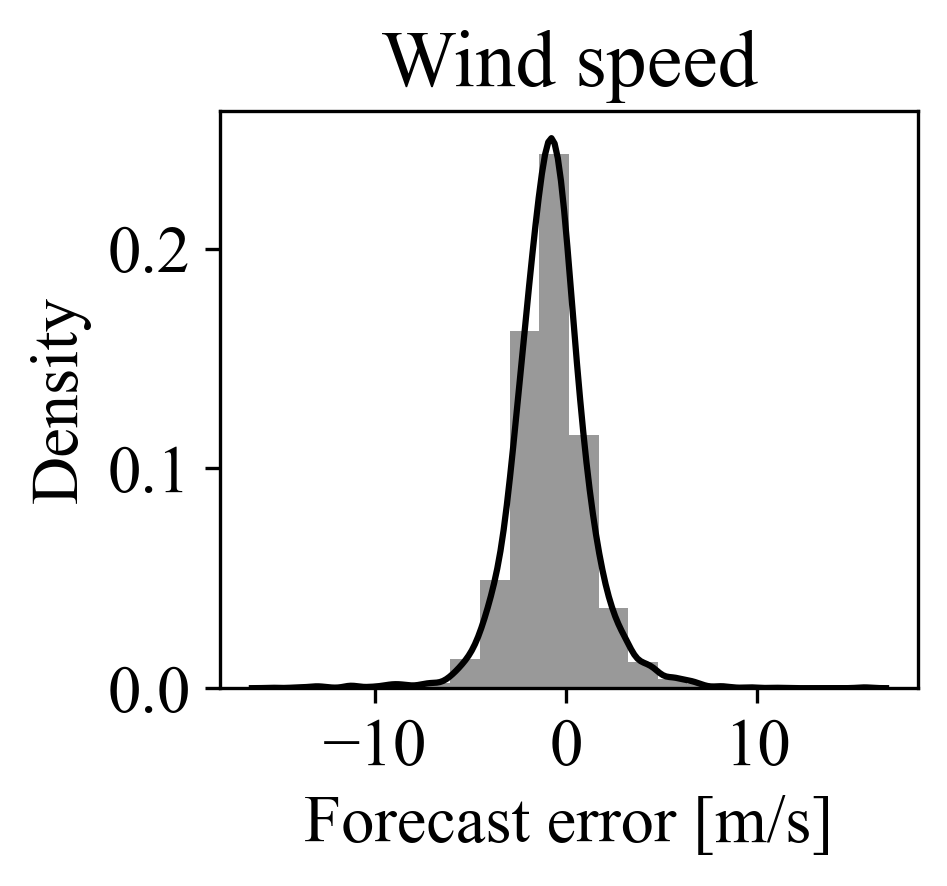

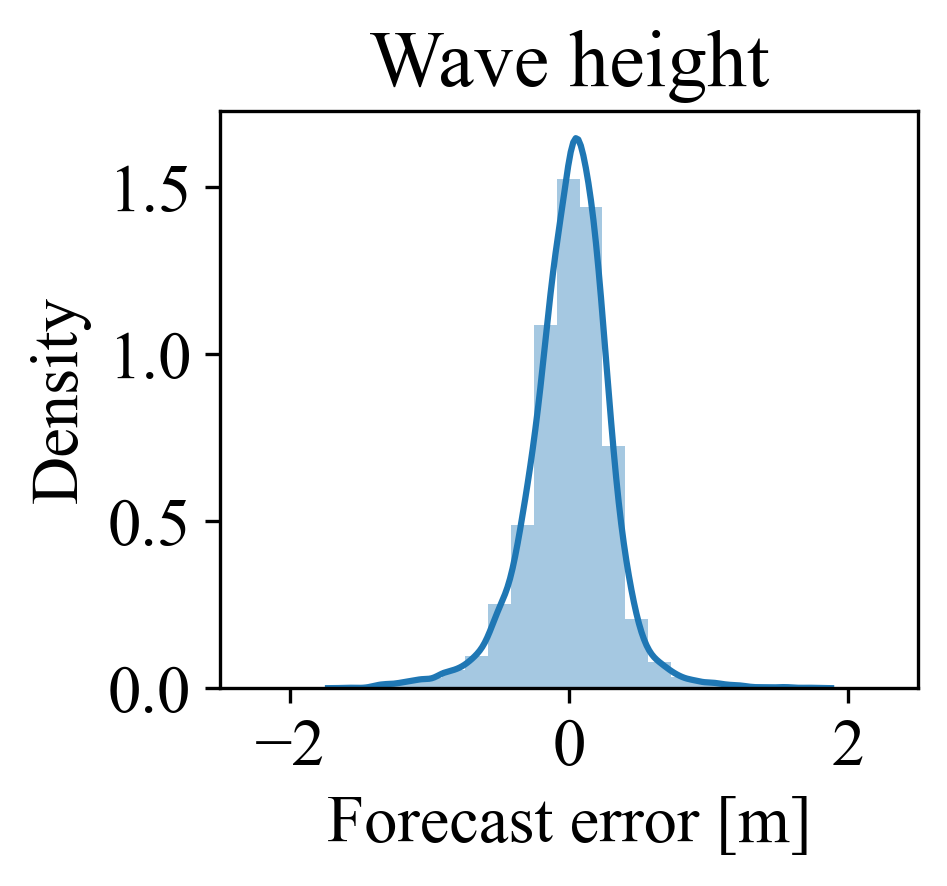

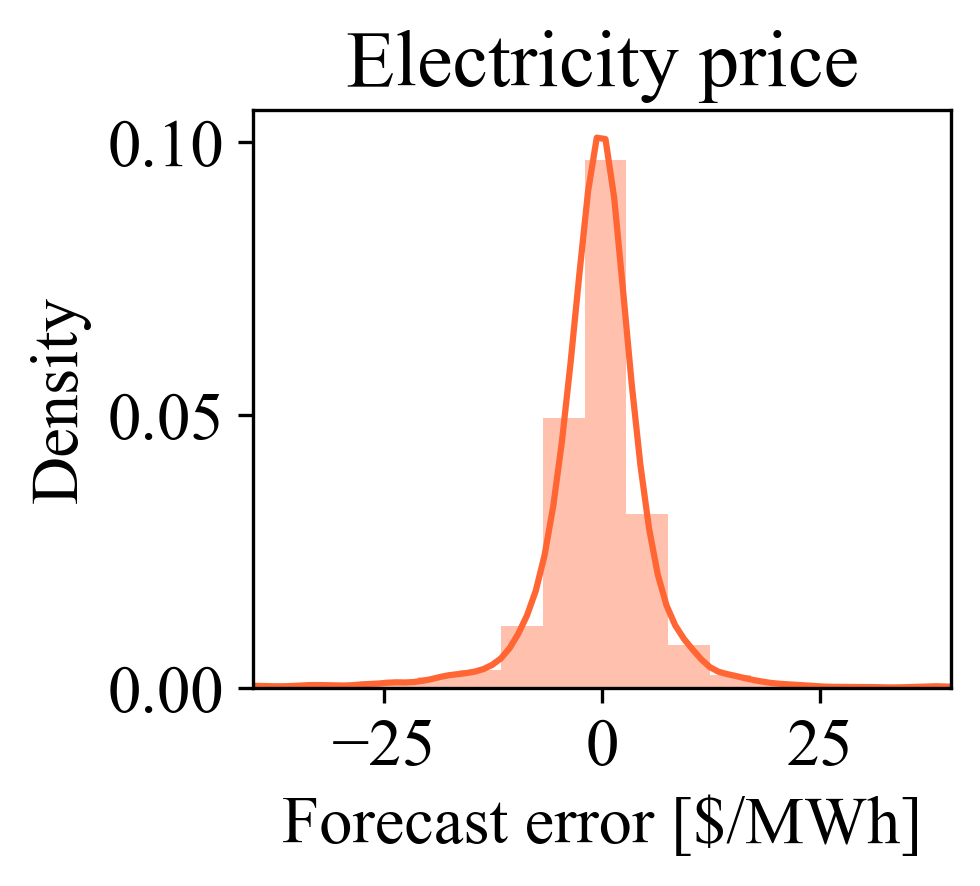

In [172]:
plt.figure(figsize=(3,2.5), dpi=300)

sns.distplot(weather_ocean_data_df['RUWRF.wind_speed_100m']-weather_ocean_data_df['NYE05.wind_speed_100m'], bins=20, color='k')
plt.xlabel('Forecast error [m/s]')
plt.title('Wind speed')

plt.figure(figsize=(3,2.5), dpi=300)

sns.distplot(weather_ocean_data_df['NOAA.wave_height']-weather_ocean_data_df['NYE05.wave_height'], bins=20)
plt.xlabel('Forecast error [m]')
plt.title('Wave height')
plt.xlim([-2.5,2.5])


plt.figure(figsize=(3,2.5), dpi=300)

sns.distplot(prices_forecasts['LEAR 56']-prices_forecasts['Real price'], bins=40, color=[1, 0.4, 0.2])
plt.xlabel('Forecast error [$/MWh]')
plt.xlim([-40,40])
plt.title('Electricity price')

In [ ]:
weather_ocean_data_df.columns

Index(['NYE05.wind_speed_100m', 'NYE05.wave_height', 'RUWRF.wind_speed_100m',
       'RUWRF.wind_dir_100m', 'NOAA.wave_height', 'NOAA.wave_dir',
       'NOAA.wind_speed_10m', 'NOAA.wind_dir_10m'],
      dtype='object')

In [ ]:
lags = 5
by = 1
start = 0
end = 300 + lags*by
cols = []
real_ws_arr = np.array(weather_ocean_data_df['RUWRF.wind_speed_100m']-weather_ocean_data_df['NYE05.wind_speed_100m'])[start:end]
real_wh_arr = np.array(weather_ocean_data_df['NOAA.wave_height']-weather_ocean_data_df['NYE05.wave_height'])[start:end]
real_ep_arr = np.array(prices_forecasts['LEAR 56']-prices_forecasts['Real price'])[start:end]

lagged_data1 = np.zeros((real_ws_arr.shape[0]-lags*by,lags))
lagged_data2 = np.zeros((real_ws_arr.shape[0]-lags*by,lags))
lagged_data3 = np.zeros((real_ws_arr.shape[0]-lags*by,lags))

for i, lag in enumerate(np.arange(0, lags*by, by)):
    lagged_data1[:,i] = real_ws_arr[lag:-lags*by+lag]
    lagged_data2[:,i] = real_wh_arr[lag:-lags*by+lag]
    lagged_data3[:,i] = real_ep_arr[lag:-lags*by+lag]
    cols.append('lag='+str(lag)) 

lagged_data1_df = pd.DataFrame(lagged_data1, columns = cols)
lagged_data2_df = pd.DataFrame(lagged_data2, columns = cols)
lagged_data3_df = pd.DataFrame(lagged_data3, columns = cols)

In [ ]:
lagged_data1_df

,lag=0,lag=1,lag=2,lag=3,lag=4
0,-1.005388,0.454746,0.855092,1.113527,2.598893
1,0.454746,0.855092,1.113527,2.598893,2.836917
2,0.855092,1.113527,2.598893,2.836917,2.302468
3,1.113527,2.598893,2.836917,2.302468,1.387196
4,2.598893,2.836917,2.302468,1.387196,0.661532
...,...,...,...,...,...
295,-1.432051,-1.045303,-0.175115,-0.424673,-1.486773
296,-1.045303,-0.175115,-0.424673,-1.486773,-1.178957
297,-0.175115,-0.424673,-1.486773,-1.178957,-0.875221
298,-0.424673,-1.486773,-1.178957,-0.875221,-0.768862


In [ ]:
def showLagKde(lagged_data, title='Wind speed residuals', c1='k', c2=[0.3,0.3,0.3], figsize=(10,3)):
    
    fig = plt.figure(figsize=figsize,dpi=200)
    lags=len(lagged_data.columns)
    gs = fig.add_gridspec(1, lags-1, hspace=0, wspace=0)
    axs = gs.subplots(sharey='col')
    
    for i,col in enumerate(lagged_data.columns[1:]):
        axs[i].plot(lagged_data[col],lagged_data['lag=0'],'.', markersize=3, color=c1,zorder=0)
        sns.kdeplot(ax=axs[i], data=lagged_data, x=col, y='lag=0', color=c2, alpha=0.9,levels=4, thresh=0.2,zorder=i+1)
    
    fig.suptitle(title)
    
    for ax in axs.flat:
        ax.label_outer()
        
    return axs

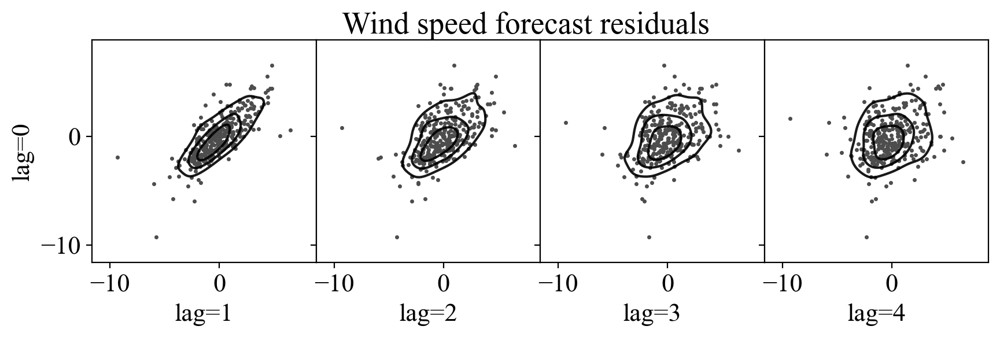

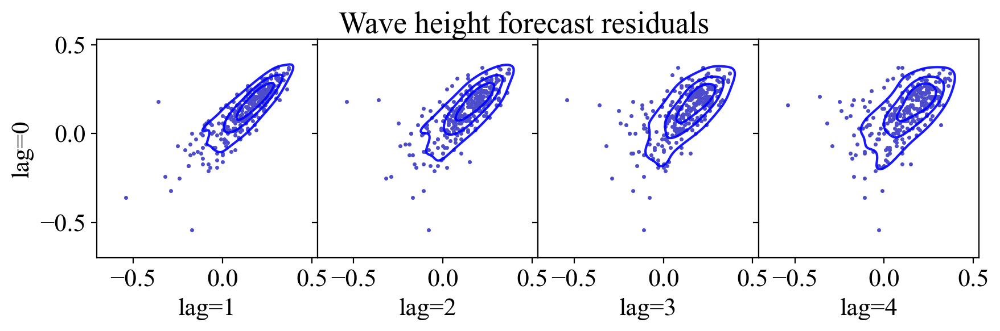

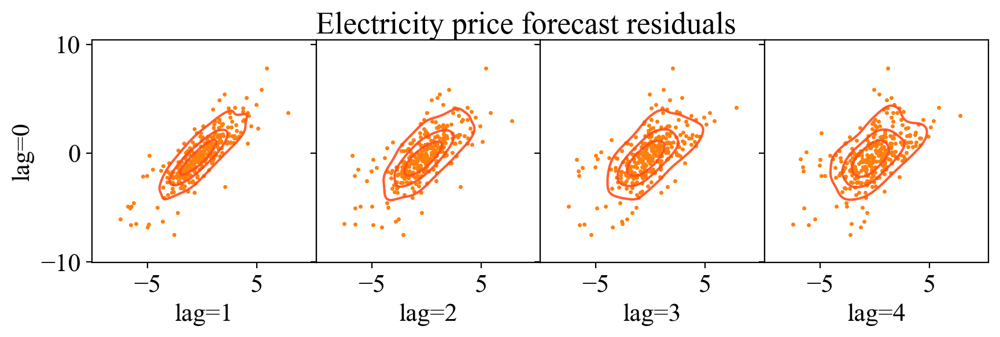

In [ ]:
_=showLagKde(lagged_data1_df, title='Wind speed forecast residuals', c1=[0.3,0.3,0.3], c2='k', figsize=(10,2.5))
_=showLagKde(lagged_data2_df, title='Wave height forecast residuals', c1=[0.3,0.3,0.8], c2='b', figsize=(10,2.5))
ax=showLagKde(lagged_data3_df, title='Electricity price forecast residuals', c1='tab:orange', c2=[1,0.3,0.1], figsize=(10,2.5))
for i in range(4):
    ax[i].set_xticks([-5,5])

# 场景生成过程图

In [158]:
###############GS-SOMS#################
from sklearn.gaussian_process import GaussianProcessRegressor#GaussianProcessRegressor是用来实现高斯过程回归（GPR）的类，它可以用来解决回归和概率分类问题
from sklearn.gaussian_process.kernels import RBF#RBF是一种常用的核函数，它是径向基函数（Radial Basis Function）的缩写，它可以用来定义高斯过程的协方差函数
from sklearn.model_selection import GridSearchCV

# 设置随机种子
np.random.seed(0)

ws_residuals_full = np.array(weather_ocean_data_df['RUWRF.wind_speed_100m']-weather_ocean_data_df['NYE05.wind_speed_100m'])
history = 5 #days
forward = 10 #day
train_end = 30 #days
pred_len = 24 #hours

Y_train = ws_residuals_full[(forward+train_end-history)*24:(forward+train_end)*24]#数组长度为5*24=120，表示5天的风速残差
X_train = np.arange(Y_train.shape[0]).reshape(-1,1)#X_train的数据是一个等差数列，从0到119，表示时间序列的索引。
print(Y_train.shape, X_train.shape)

weather_ocean_data_df.index[40*24] #日期如下图所示

ws_forecast = np.array(weather_ocean_data_df['RUWRF.wind_speed_100m'])
ws_true = np.array(weather_ocean_data_df['NYE05.wind_speed_100m'])

# 定义参数网格
param_grid = {
    'kernel': [RBF()],
    'alpha': np.random.normal(0.5,1,(Y_train.shape[0]))**2
}

# 使用GridSearchCV进行参数优化，交叉验证优化
gp = GaussianProcessRegressor(random_state=0, n_restarts_optimizer=10)
grid_search = GridSearchCV(gp, param_grid, cv=5)
grid_search.fit(X_train, Y_train)
#kernel: 传入之前创建的RBF核函数对象，表示使用该核函数作为高斯过程的先验协方差。
#alpha: 传入一个一维数组，表示训练数据的噪声水平，它是从正态分布N(0.5, 1)中随机生成的，并且平方后得到。这个参数可以防止数值问题，并且相当于在核矩阵的对角线上加上一个白噪声核
#random_state: 传入一个整数0，表示设置随机数种子，以保证结果的可重复性
#n_restarts_optimizer: 传入一个整数10，表示优化器寻找最大化对数边缘似然的核参数时的重启次数，这可以提高寻找全局最优解的可能性

t1 = time()#用time()函数获取当前的时间（以秒为单位），并赋值给t1变量
gp.fit(X_train, Y_train) #用gp对象的fit()方法来对X_train和Y_train进行高斯过程回归（GPR）拟合
print(time()-t1)

Y_val = ws_residuals_full[(forward+train_end)*24:(forward+train_end)*24+pred_len]#取出pred_len长度的数据
X_val = (X_train[-1,0] + np.arange(pred_len)).reshape(-1,1)#定义一个119到142的二维数组

ws_forecast_val = ws_forecast[(forward+train_end)*24:(forward+train_end)*24+pred_len].copy()
ws_true_val = ws_true[(forward+train_end)*24:(forward+train_end)*24+pred_len].copy()

# 使用最佳参数进行预测
best_gp = grid_search.best_estimator_
Y_pred, sigma_pred = best_gp.predict(X_val, return_cov=True)
#对验证数据集进行高斯过程回归（GPR）预测，并返回预测的均值和协方差
#Y_pred是一个一维数组，长度为pred_len，表示预测时间段内的风速残差的均值
#sigma_pred是一个二维数组，形状为(pred_len, pred_len)，表示预测时间段内的风速残差的协方差矩阵

samples = best_gp.sample_y(X_val, 1000) #设置要生成的场景数量

(120,) (120, 1)
0.0020024776458740234


In [159]:
ws_pred_mean = ws_forecast_val - Y_pred
ws_pred_samples = ws_forecast_val.reshape(-1,1) - samples

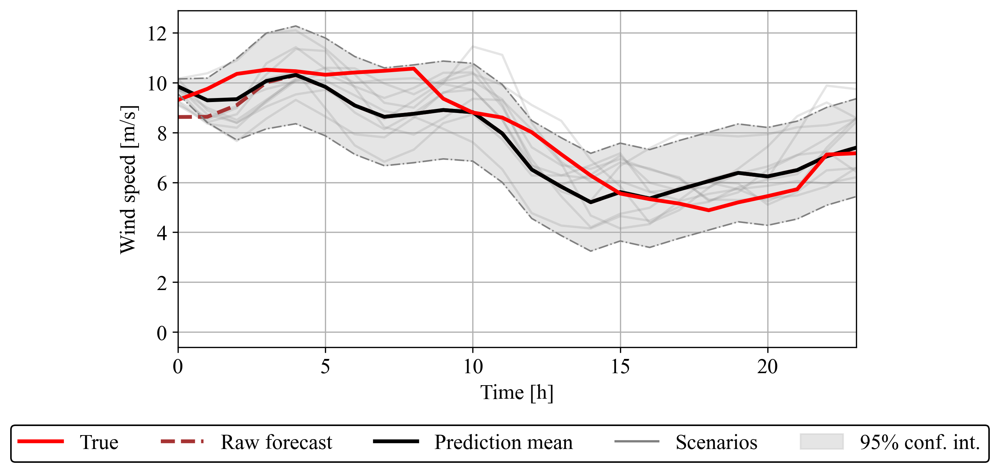

In [160]:
x = np.arange(24)
plt.figure(figsize=(8,4), dpi=300)

plt.plot([-1,-2],[0,1], color='red', linewidth=2.5)
plt.plot([-1,-2],[0,1], color=[0.65,0.2,0.2],linewidth=2.5,linestyle='--')
plt.plot([-1,-2],[0,1], color='black', linewidth=2.5)
plt.plot([-1,-2],[0,1], color='grey')
plt.fill_between([-1,-2],[0,1], alpha=0.5, color=[0.8,0.8,0.8])

plt.legend(['True', 'Raw forecast', 'Prediction mean', 'Scenarios', '95% conf. int.'], ncol=5, 
           loc='upper center', bbox_to_anchor=(0,0,0.95,-0.2), framealpha=1, edgecolor='k')


plt.plot(ws_pred_samples[:,:10], color='grey', alpha=0.2)
plt.plot(ws_forecast_val, color=[0.65,0.2,0.2],linewidth=2.5,linestyle='--')
plt.plot(x,ws_pred_mean, color='black', linewidth=2.5)
plt.plot(x,ws_true_val, '-', color='red', linewidth=2.5)

plt.plot(x,ws_pred_mean - 1.9600 * np.diag(sigma_pred), color=[0.5,0.5,0.5], linewidth=1, linestyle='-.')
plt.plot(x,ws_pred_mean + 1.9600 * np.diag(sigma_pred), color=[0.5,0.5,0.5], linewidth=1, linestyle='-.')

plt.fill(np.concatenate([x, x[::-1]]),
    np.concatenate([ws_pred_mean - 1.9600 * np.diag(sigma_pred), (ws_pred_mean + 1.9600 * np.diag(sigma_pred))[::-1]]),
    alpha=0.5, color=[0.8,0.8,0.8])

plt.xlim([0,23])
plt.ylabel('Wind speed [m/s]')
plt.xlabel('Time [h]')
plt.grid(True)

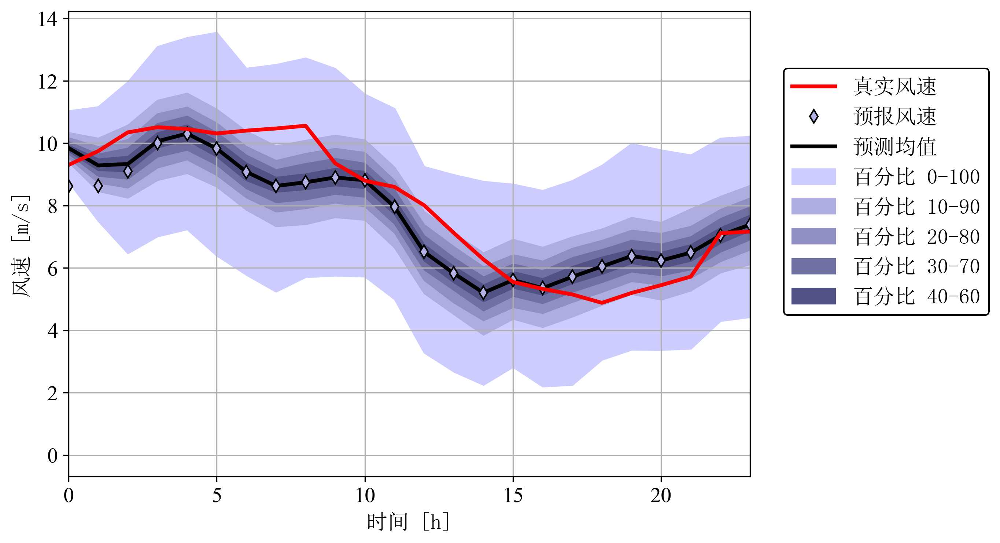

In [161]:
x = np.arange(24)
plt.figure(figsize=(8,5.5), dpi=300)
percentiles = [0,10,20,30,40]

plt.plot([-1,-2],[0,1], color='red', linewidth=2.5) #true
plt.plot([-1,-2],[0,1], 'd', color=[0.7,0.7,0.9],linewidth=2.5, markeredgecolor='k',markersize=6) #raw forecast
plt.plot([-1,-2],[0,1], color='black', linewidth=2.5) #predicted mean
leg = ['真实风速', '预报风速', '预测均值']
for i in percentiles:
    plt.fill_between([-1,-2],[0,1], color=[0.8-1.2*i/100,0.8-1.2*i/100,1-1.2*i/100])#scenarios
    leg.append('百分比 '+str(i)+'-'+str(100-i))


plt.legend(leg, ncol=1, loc='upper center', bbox_to_anchor=(1.2,0.9,0,0), framealpha=1, edgecolor='k',prop={"family": "SimSun"})


# plt.plot(ws_pred_samples, color='grey', alpha=0.2)
plt.plot(x,ws_pred_mean, color='black', linewidth=2.5)
plt.plot(ws_forecast_val, 'd', color=[0.7,0.7,0.9],linewidth=2.5, markeredgecolor='k',markersize=6)
plt.plot(x,ws_true_val, '-', color='red', linewidth=2.5)

# plt.plot(x,ws_pred_mean - 1.9600 * sigma1_pred, color=[0.5,0.5,0.5], linewidth=1, linestyle='-.')
# plt.plot(x,ws_pred_mean + 1.9600 * sigma1_pred, color=[0.5,0.5,0.5], linewidth=1, linestyle='-.')


for i in percentiles:
    plt.fill_between(x,np.percentile(ws_pred_samples,i,1),np.percentile(ws_pred_samples,100-i,1),
                     color=[0.8-1.2*i/100,0.8-1.2*i/100,1-1.2*i/100])

plt.xlim([0,23])
plt.ylabel('风速 [m/s]', fontdict={"family": "SimSun"})
plt.xlabel('时间 [h]', fontdict={"family": "SimSun"})
plt.grid(True)